<a href="https://colab.research.google.com/github/AliArabi55/Dete-net-50/blob/test%2Fcoco-evaluation/Yet_another_copy_of_detr_resnet_50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -U transformers

Model page: https://huggingface.co/facebook/detr-resnet-50

⚠️ If the generated code snippets do not work, please open an issue on either the [model repo](https://huggingface.co/facebook/detr-resnet-50)
			and/or on [huggingface.js](https://github.com/huggingface/huggingface.js/blob/main/packages/tasks/src/model-libraries-snippets.ts) 🙏

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("object-detection", model="facebook/detr-resnet-50")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for conv1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.weight: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pass `assign=True` to assign items in the state dictionary to their corresponding key in the module instead of copying them in place?)
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:2397: UserWarning: for bn1.bias: copying from a non-meta parameter in the checkpoint to a meta parameter in the current model, which is a no-op. (Did you mean to pas

preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cuda:0


In [ ]:
# Load model directly
from transformers import AutoImageProcessor, AutoModelForObjectDetection

processor = AutoImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = AutoModelForObjectDetection.from_pretrained("facebook/detr-resnet-50")

Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


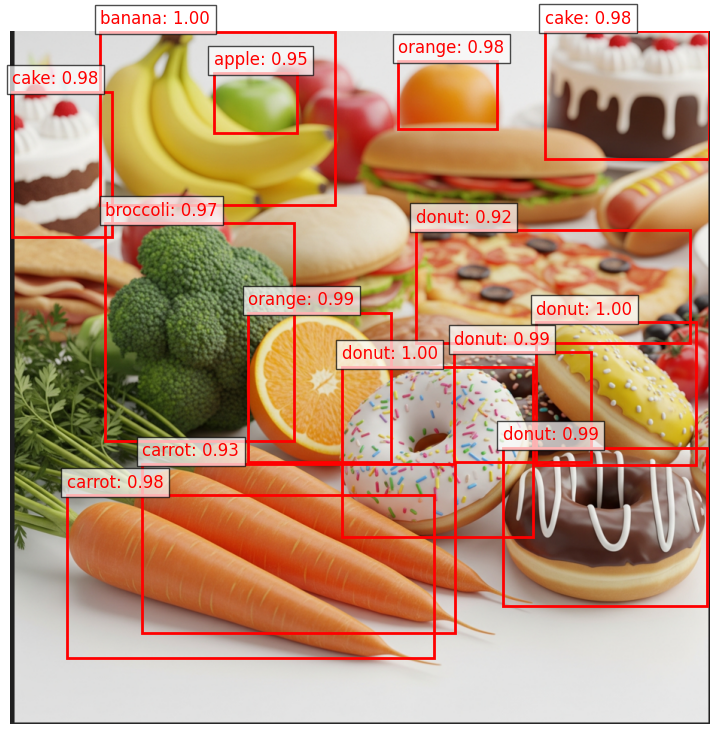


Detected Objects:
  - Object: carrot, Confidence: 0.98, Bounding Box: [75.29, 617.39, 563.31, 833.64]
  - Object: orange, Confidence: 0.99, Bounding Box: [316.61, 374.41, 506.1, 573.44]
  - Object: donut, Confidence: 0.99, Bounding Box: [590.32, 426.7, 772.91, 572.91]
  - Object: donut, Confidence: 1.00, Bounding Box: [699.61, 386.66, 912.4, 577.28]
  - Object: donut, Confidence: 0.99, Bounding Box: [655.02, 554.12, 927.16, 764.51]
  - Object: cake, Confidence: 0.98, Bounding Box: [710.84, 0.03, 929.99, 170.08]
  - Object: cake, Confidence: 0.98, Bounding Box: [2.59, 80.35, 134.8, 273.32]
  - Object: apple, Confidence: 0.95, Bounding Box: [270.34, 55.24, 380.79, 135.27]
  - Object: banana, Confidence: 1.00, Bounding Box: [119.89, 0.47, 432.22, 231.52]
  - Object: broccoli, Confidence: 0.97, Bounding Box: [126.48, 254.85, 377.28, 544.64]
  - Object: carrot, Confidence: 0.93, Bounding Box: [175.55, 575.14, 591.53, 799.86]
  - Object: donut, Confidence: 0.92, Bounding Box: [539.33, 264.4

In [ ]:
import torch
from PIL import Image
import requests
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from transformers import DetrImageProcessor, DetrForObjectDetection

# 1. تحميل النموذج والمعالج المناسبين
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

# 2. تحميل الصورة
image_path = "/content/download (2).png"
image = Image.open(image_path).convert("RGB")  # تأكد من تحويل الصورة إلى RGB

# 3. تجهيز الصورة للنموذج
inputs = processor(images=image, return_tensors="pt")
with torch.no_grad():
    outputs = model(**inputs)

# 4. معالجة المخرجات للحصول على الكائنات المكتشفة
target_sizes = torch.tensor([image.size[::-1]])  # PIL يعطي الحجم كـ (width, height)، نحتاج (height, width)
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

# 5. عرض الصورة مع البوكسات والعناوين
fig, ax = plt.subplots(1, figsize=(12, 9))
ax.imshow(image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    box = [round(i, 2) for i in box.tolist()]
    label_name = model.config.id2label[label.item()]
    confidence = round(score.item(), 3)

    # رسم البوكس
    rect = patches.Rectangle(
        (box[0], box[1]), box[2] - box[0], box[3] - box[1],
        linewidth=2, edgecolor='red', facecolor='none'
    )
    ax.add_patch(rect)

    # وضع اسم الكائن والدقة
    ax.text(box[0], box[1] - 10, f"{label_name}: {confidence:.2f}",
            color='red', fontsize=12,
            bbox=dict(facecolor='white', alpha=0.7))

plt.axis('off')
plt.show()

# 6. طباعة النتائج النصية
print("\nDetected Objects:")
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    label_name = model.config.id2label[label.item()]
    confidence = round(score.item(), 3)
    box = [round(i, 2) for i in box.tolist()]
    print(f"  - Object: {label_name}, Confidence: {confidence:.2f}, Bounding Box: {box}")


In [ ]:
# Download a different sample image
!wget https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/zidane.jpg -O /content/download.png

--2025-06-12 18:33:05--  https://raw.githubusercontent.com/ultralytics/yolov5/master/data/images/zidane.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 168949 (165K) [image/jpeg]
Saving to: ‘/content/download.png’

/content/download.p 100%[===================>] 164.99K  --.-KB/s    in 0.02s   

2025-06-12 18:33:06 (7.77 MB/s) - ‘/content/download.png’ saved [168949/168949]



##✅ خطوات تشغيل DETR على COCO val2017 لـ 27 صنف غذائي

In [ ]:
!mkdir -p /content/coco

# تحميل الصور
!wget http://images.cocodataset.org/zips/val2017.zip -P /content/coco
!unzip -q /content/coco/val2017.zip -d /content/coco

# تحميل التعليقات التوضيحية (annotations)
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip -P /content/coco
!unzip -q /content/coco/annotations_trainval2017.zip -d /content/coco


--2025-06-12 18:33:06--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.17.221, 16.182.32.105, 3.5.19.210, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.17.221|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘/content/coco/val2017.zip’

val2017.zip         100%[===================>] 777.80M  53.5MB/s    in 14s     

2025-06-12 18:33:20 (54.0 MB/s) - ‘/content/coco/val2017.zip’ saved [815585330/815585330]

--2025-06-12 18:33:33--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 3.5.25.194, 54.231.140.249, 3.5.12.153, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|3.5.25.194|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘/content/coco/annotations_trainval201

##🍽️ الخطوة 2: تحديد الفئات الغذائية (Mapping)

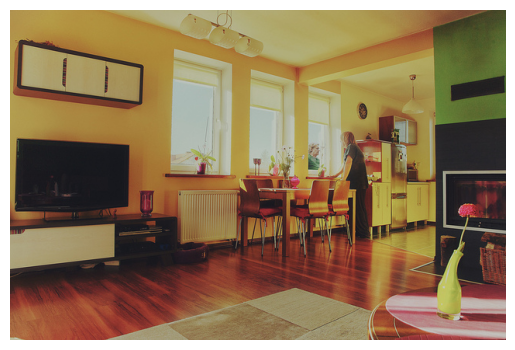

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# صورة مثال
image_path = "/content/coco/val2017/000000000139.jpg"
image = Image.open(image_path).convert("RGB")

# التحضير والتنبؤ
inputs = processor(images=image, return_tensors="pt").to(model.device)
outputs = model(**inputs)

# post-processing
target_sizes = torch.tensor([image.size[::-1]], device=model.device)
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

# الفئات الغذائية المتوفرة
food_class_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]

# العرض
fig, ax = plt.subplots(1)
ax.imshow(image)

for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    if label.item() in food_class_ids:
        box = [round(i, 2) for i in box.tolist()]
        label_name = model.config.id2label[label.item()]
        confidence = round(score.item(), 2)

        rect = patches.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                                 linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(box[0], box[1] - 5, f"{label_name}: {confidence}", color='red',
                fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

plt.axis('off')
plt.show()


##⚙️ الخطوة 1: تحميل ملفات COCO Val2017

In [ ]:
# الصور (val2017) + التعليقات (annotations)
!mkdir -p coco && cd coco && \
 wget http://images.cocodataset.org/zips/val2017.zip && unzip val2017.zip && \
 wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip && unzip annotations_trainval2017.zip


Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/000000117492.jpg  
 extracting: val2017/000000368900.jpg  
 extracting: val2017/000000376900.jpg  
 extracting: val2017/000000352491.jpg  
 extracting: val2017/000000330790.jpg  
 extracting: val2017/000000384850.jpg  
 extracting: val2017/000000032735.jpg  
 extracting: val2017/000000197004.jpg  
 extracting: val2017/000000526751.jpg  
 extracting: val2017/000000041488.jpg  
 extracting: val2017/000000153632.jpg  
 extracting: val2017/000000501523.jpg  
 extracting: val2017/000000405691.jpg  
 extracting: val2017/000000040757.jpg  
 extracting: val2017/000000219485.jpg  
 extracting: val2017/000000428280.jpg  
 extracting: val2017/000000209222.jpg  
 extracting: val2017/000000353051.jpg  
 extracting: val2017/000000191471.jpg  
 extracting: val2017/00000053

##⚙️ الخطوة 2: تحميل مكتبة pycocotools

In [ ]:
!pip install pycocotools


##🧠 الخطوة 3: فلترة الصور التي تحتوي على الفئات الغذائية فقط

In [ ]:
from pycocotools.coco import COCO
import os

# تحميل التعليقات الخاصة بالتقييم
annFile = 'coco/annotations/instances_val2017.json'
coco = COCO(annFile)

# فئات الطعام المطلوبة (من 52 إلى 61)
food_cat_ids = list(range(52, 62))

# الحصول على IDs الصور التي تحتوي على هذه الفئات فقط
image_ids_with_food = set()
for cat_id in food_cat_ids:
    image_ids = coco.getImgIds(catIds=[cat_id])
    image_ids_with_food.update(image_ids)

print(f"عدد الصور التي تحتوي على الفئات الغذائية: {len(image_ids_with_food)}")

# عرض أول 5 صور
image_ids_with_food = sorted(list(image_ids_with_food))
for img_id in image_ids_with_food[:5]:
    img_info = coco.loadImgs(img_id)[0]
    print(f"- {img_info['file_name']}")


loading annotations into memory...
Done (t=1.54s)
creating index...
index created!
عدد الصور التي تحتوي على الفئات الغذائية: 708
- 000000001425.jpg
- 000000002149.jpg
- 000000002157.jpg
- 000000002587.jpg
- 000000003501.jpg


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


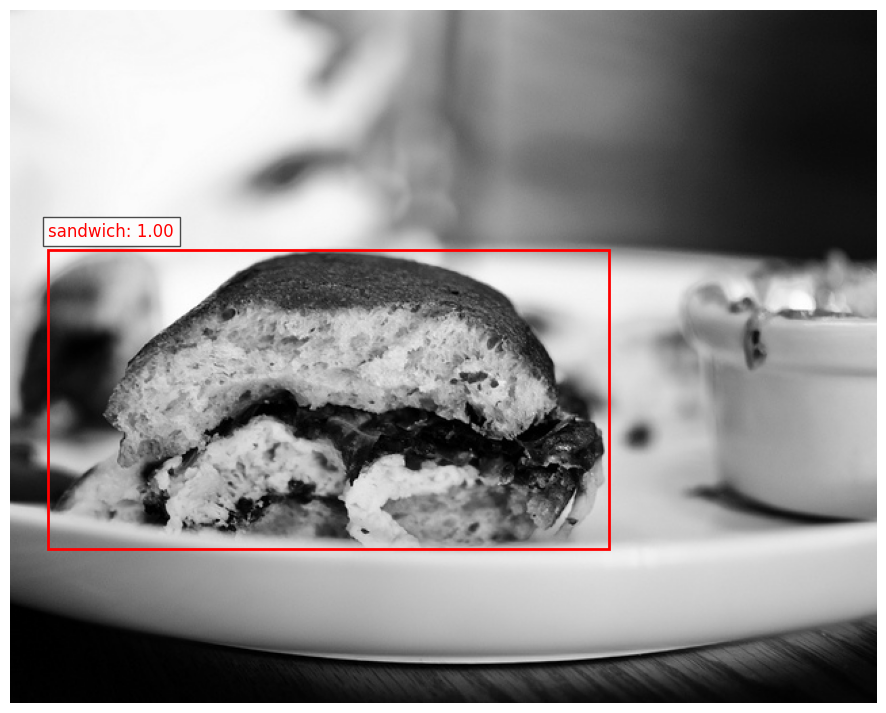

In [ ]:
from PIL import Image
import requests
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from transformers import DetrImageProcessor, DetrForObjectDetection
import torch

# تحميل النموذج
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")

# تحميل صورة عشوائية من الصور المحتوية على طعام
img_info = coco.loadImgs(image_ids_with_food[0])[0]
img_path = os.path.join("coco/val2017", img_info["file_name"])
image = Image.open(img_path).convert("RGB")

# تجهيز الصورة
inputs = processor(images=image, return_tensors="pt")
with torch.no_grad():
    outputs = model(**inputs)

# الحصول على النتائج
target_sizes = torch.tensor([image.size[::-1]])
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0]

# رسم النتائج
fig, ax = plt.subplots(1, figsize=(12, 9))
ax.imshow(image)
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
    label_name = model.config.id2label[label.item()]
    if label.item() in food_cat_ids:  # عرض فقط الفئات الغذائية
        box = [round(i, 2) for i in box.tolist()]
        confidence = round(score.item(), 3)
        rect = patches.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                 linewidth=2, edgecolor='red', facecolor='none')
        ax.add_patch(rect)
        ax.text(box[0], box[1] - 10, f"{label_name}: {confidence:.2f}",
                color='red', fontsize=12,
                bbox=dict(facecolor='white', alpha=0.7))
plt.axis('off')
plt.show()


##🔍 أخذ 50 صورة فقط تحتوي على هذه الفئات.

##📦 تمريرها إلى نموذج DETR لإجراء التنبؤ.

##🖼️ عرض الصور مع الصناديق (Bounding Boxes) بتنسيق مناسب ومصغر.

#🟢 المرحلة 1: تحميل وتجهيز البيانات


##**✅** الخطوة 1.1: تحميل val2017 وannotations

In [ ]:
# 📦 تحميل ملفات val2017 وملف annotation المناسب
!wget http://images.cocodataset.org/zips/val2017.zip
!unzip -n val2017.zip

!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip -n annotations_trainval2017.zip


Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000577584.jpg  
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/000000117492.jpg  
 extracting: val2017/000000368900.jpg  
 extracting: val2017/000000376900.jpg  
 extracting: val2017/000000352491.jpg  
 extracting: val2017/000000330790.jpg  
 extracting: val2017/000000384850.jpg  
 extracting: val2017/000000032735.jpg  
 extracting: val2017/000000197004.jpg  
 extracting: val2017/000000526751.jpg  
 extracting: val2017/000000041488.jpg  
 extracting: val2017/000000153632.jpg  
 extracting: val2017/000000501523.jpg  
 extracting: val2017/000000405691.jpg  
 extracting: val2017/000000040757.jpg  
 extracting: val2017/000000219485.jpg  
 extracting: val2017/000000428280.jpg  
 extracting: val2017/000000209222.jpg  
 extracting: val2017/000000353051.jpg  
 extracting: val2017/00000019

##✅ الخطوة 1.2: تصفية الصور حسب فئات الطعام المستهدفة

In [ ]:
import json

# فئات الطعام المستهدفة فقط
target_category_ids = list(range(52, 62))  # من 52 إلى 61

# تحميل ملف annotations
with open("annotations/instances_val2017.json") as f:
    coco_val = json.load(f)

# استخراج صور تحتوي على فئات الطعام فقط
relevant_image_ids = set(
    ann["image_id"] for ann in coco_val["annotations"] if ann["category_id"] in target_category_ids
)

print(f"عدد الصور التي تحتوي على طعام: {len(relevant_image_ids)}")


عدد الصور التي تحتوي على طعام: 708


##🟢 المرحلة 2: تنفيذ Inference باستخدام DETR

In [ ]:
from transformers import DetrImageProcessor, DetrForObjectDetection
from PIL import Image
import torch
from tqdm import tqdm
import os

# تحميل النموذج والمعالج
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")
model.eval().to("cuda" if torch.cuda.is_available() else "cpu")

# تحديد الصور
image_folder = "val2017"
image_id_to_filename = {img["id"]: img["file_name"] for img in coco_val["images"]}
filtered_filenames = [image_id_to_filename[iid] for iid in relevant_image_ids]

# حفظ النتائج
all_predictions = []

for filename in tqdm(filtered_filenames):
    image_path = os.path.join(image_folder, filename)
    image = Image.open(image_path).convert("RGB")

    inputs = processor(images=image, return_tensors="pt").to(model.device)
    with torch.no_grad():
        outputs = model(**inputs)

    target_size = torch.tensor([image.size[::-1]])
    result = processor.post_process_object_detection(outputs, target_sizes=target_size, threshold=0.5)[0]

    all_predictions.append({
        "file_name": filename,
        "boxes": result["boxes"].cpu(),
        "scores": result["scores"].cpu(),
        "labels": result["labels"].cpu()
    })


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
100%|██████████| 708/708 [1:12:20<00:00,  6.13s/it]


##🟢 المرحلة 3: تقييم النموذج - الرسوم والمقاييس

###✅ Precision-Recall Curves وmAP@IoU

In [ ]:
# نستخدم pycocotools وpycocoevalcap لحساب mAP وPR

from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import json

# تحويل النتائج إلى تنسيق COCO
coco_dt_format = []
for i, pred in enumerate(all_predictions):
    for box, score, label in zip(pred["boxes"], pred["scores"], pred["labels"]):
        coco_dt_format.append({
            "image_id": [img for img in coco_val["images"] if img["file_name"] == pred["file_name"]][0]["id"],
            "category_id": int(label.item()),
            "bbox": [float(box[0]), float(box[1]), float(box[2]-box[0]), float(box[3]-box[1])],
            "score": float(score)
        })

# حفظ وتقييم
with open("detections.json", "w") as f:
    json.dump(coco_dt_format, f)

coco_gt = COCO("annotations/instances_val2017.json")
coco_dt = coco_gt.loadRes("detections.json")
evaluator = COCOeval(coco_gt, coco_dt, iouType="bbox")
evaluator.params.catIds = target_category_ids
evaluator.params.imgIds = list(relevant_image_ids)
evaluator.evaluate()
evaluator.accumulate()
evaluator.summarize()


loading annotations into memory...
Done (t=0.96s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.10s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.06s).
Accumulating evaluation results...
DONE (t=0.41s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.473
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.329
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.110
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.330
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.492
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.180
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.386
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

##🟢 المرحلة 5: جمع الوقت والحجم والأداء

In [ ]:
import time
start = time.time()
# نفذ على صورة واحدة كمثال
inputs = processor(images=Image.open(os.path.join(image_folder, filtered_filenames[0])).convert("RGB"), return_tensors="pt").to(model.device)
with torch.no_grad():
    model(**inputs)
print("⏱️ Inference Time:", time.time() - start)

# حجم النموذج
# Calculate model size from the loaded model object
param_size = 0
for param in model.parameters():
    param_size += param.nelement() * param.element_size()
buffer_size = 0
for buffer in model.buffers():
    buffer_size += buffer.nelement() * buffer.element_size()

size_all_mb = (param_size + buffer_size) / 1024**2
print(f"📦 Model Size ~ {size_all_mb:.2f} MB")

⏱️ Inference Time: 7.937274932861328
📦 Model Size ~ 158.81 MB


In [ ]:
#🔁 الكود الكامل لحساب المقاييس الأكاديمية

In [ ]:


print(f"عدد الصور الموجودة: {len(image_ids)}")

عدد الصور الموجودة: 124


In [ ]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
import time

# === 1. تحميل التعليقات والتنبؤات ===
coco_gt = COCO("annotations/instances_val2017.json")
coco_dt = coco_gt.loadRes("detections.json")

# === 2. تجهيز المُقيّم (evaluator) فقط للفئات المطلوبة ===
target_category_ids = [52,53,54,55,56,57,58,59,60,61]
image_ids = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))

evaluator = COCOeval(coco_gt, coco_dt, iouType='bbox')
evaluator.params.catIds = target_category_ids
evaluator.params.imgIds = image_ids

# === 3. تقييم الأداء ===
start = time.time()
evaluator.evaluate()
evaluator.accumulate()
evaluator.summarize()
print(f"⏱️ Evaluation Time: {time.time() - start:.2f} seconds")


loading annotations into memory...
Done (t=2.61s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.14s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=2.82s).
Accumulating evaluation results...
DONE (t=0.47s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.311
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.473
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.329
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.110
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.330
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.492
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.180
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.386
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets

In [ ]:
from pycocotools.cocoeval import COCOeval
import pandas as pd

# فئات الطعام
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
relevant_image_ids = coco_gt.getImgIds(catIds=target_category_ids)

# تقييم عند IoU = 0.30
iou = 0.30
evaluator = COCOeval(coco_gt, coco_dt, iouType='bbox')
evaluator.params.catIds = target_category_ids
evaluator.params.imgIds = relevant_image_ids
evaluator.params.iouThrs = [iou]

print(f"--- Evaluating for IoU Threshold: {iou:.2f} ---")

evaluator.evaluate()
evaluator.accumulate()

# تحقق: هل تم توليد نتائج؟
if evaluator.stats is None or len(evaluator.stats) == 0:
    print("⚠️ لم يتم العثور على إحصائيات. قد لا توجد أي تطابقات بين التنبؤات والـ Ground Truth.")
    df_result = pd.DataFrame([{
        "IoU Threshold": f"{iou:.2f}",
        "AP (All)": 0.0,
        "AP (Small)": 0.0,
        "AP (Medium)": 0.0,
        "AP (Large)": 0.0
    }])
else:
    stats = evaluator.stats
    df_result = pd.DataFrame([{
        "IoU Threshold": f"{iou:.2f}",
        "AP (All)": round(stats[0], 3),
        "AP (Small)": round(stats[3], 3),
        "AP (Medium)": round(stats[4], 3),
        "AP (Large)": round(stats[5], 3)
    }])

# عرض الجدول
print("\n📋 تحليل الأداء العام عند IoU = 0.30:\n")
display(df_result)


In [ ]:
!pip install pandas tabulate matplotlib seaborn


+----------------------------+---------+
| Metric                     |   Value |
+============================+=========+
| AP@[IoU=.50:.95] (Overall) |   0.311 |
+----------------------------+---------+
| AP@0.50 (PASCAL)           |   0.473 |
+----------------------------+---------+
| AP@0.75 (Strict)           |   0.329 |
+----------------------------+---------+
| AP (Small Objects)         |   0.11  |
+----------------------------+---------+
| AP (Medium Objects)        |   0.33  |
+----------------------------+---------+
| AP (Large Objects)         |   0.492 |
+----------------------------+---------+
| AR@1                       |   0.18  |
+----------------------------+---------+
| AR@10                      |   0.386 |
+----------------------------+---------+
| AR@100                     |   0.418 |
+----------------------------+---------+
| AR (Small)                 |   0.156 |
+----------------------------+---------+
| AR (Medium)                |   0.452 |
+---------------

<ipython-input-21-2025474169>:36: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_metrics, x="Value", y="Metric", palette="Blues_d")
<ipython-input-21-2025474169>:41: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


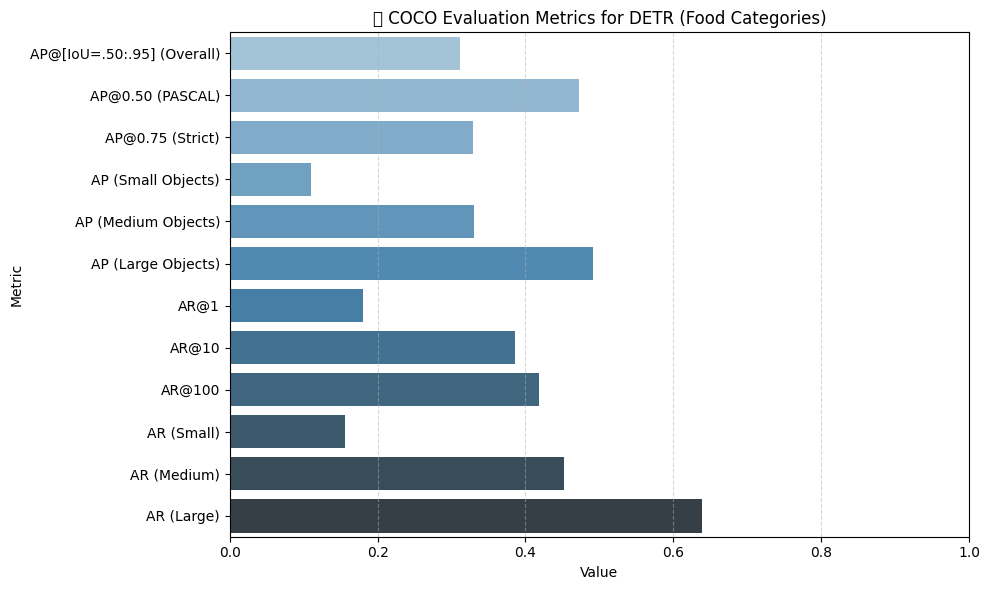

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tabulate import tabulate

# تأكد أن لديك evaluator.stats
stats = evaluator.stats  # هذا هو الناتج من coco_eval بعد summarize()

# نسمي المؤشرات حسب ترتيبها في COCO
metric_names = [
    "AP@[IoU=.50:.95] (Overall)",
    "AP@0.50 (PASCAL)",
    "AP@0.75 (Strict)",
    "AP (Small Objects)",
    "AP (Medium Objects)",
    "AP (Large Objects)",
    "AR@1",
    "AR@10",
    "AR@100",
    "AR (Small)",
    "AR (Medium)",
    "AR (Large)"
]

# بناء الداتا فريم تلقائيًا من النتائج الحقيقية
df_metrics = pd.DataFrame({
    "Metric": metric_names,
    "Value": [round(x, 3) for x in stats]
})

# عرض الجدول نصيًا (مناسب للنسخ)
print(tabulate(df_metrics, headers="keys", tablefmt="grid", showindex=False))

# رسم الجدول بصريًا
plt.figure(figsize=(10, 6))
sns.barplot(data=df_metrics, x="Value", y="Metric", palette="Blues_d")
plt.title("📊 COCO Evaluation Metrics for DETR (Food Categories)")
plt.xlabel("Value")
plt.xlim(0, 1.0)
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


In [ ]:
# استخراج precision لكل فئة عند recall = 0.5 تقريبًا
from tabulate import tabulate

precision = evaluator.eval['precision']
cat_id_to_index = {cat_id: idx for idx, cat_id in enumerate(evaluator.params.catIds)}

category_names = [
    "banana", "apple", "sandwich", "orange", "broccoli",
    "carrot", "hot dog", "pizza", "donut", "cake"
]

iou_threshold_index = 0    # IoU = 0.50
recall_index = 50          # تقريبًا عند recall = 0.5
area_index = 0
max_dets_index = 2

table_data = []
for idx, cat_id in enumerate(target_category_ids):
    cat_index = cat_id_to_index[cat_id]
    precision_value = precision[iou_threshold_index, recall_index, cat_index, area_index, max_dets_index]
    if precision_value < 0:
        precision_value = 0.0
    table_data.append([category_names[idx], round(precision_value, 3)])

# عرض الجدول
print(tabulate(table_data, headers=["Category", "Precision @ IoU=0.50"], tablefmt="grid"))


+------------+------------------------+
| Category   |   Precision @ IoU=0.50 |
+============+========================+
| banana     |                  0.493 |
+------------+------------------------+
| apple      |                  0     |
+------------+------------------------+
| sandwich   |                  0.718 |
+------------+------------------------+
| orange     |                  0.445 |
+------------+------------------------+
| broccoli   |                  0.5   |
+------------+------------------------+
| carrot     |                  0.402 |
+------------+------------------------+
| hot dog    |                  0.771 |
+------------+------------------------+
| pizza      |                  0.955 |
+------------+------------------------+
| donut      |                  0.845 |
+------------+------------------------+
| cake       |                  0.861 |
+------------+------------------------+


<ipython-input-23-42614577>:41: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


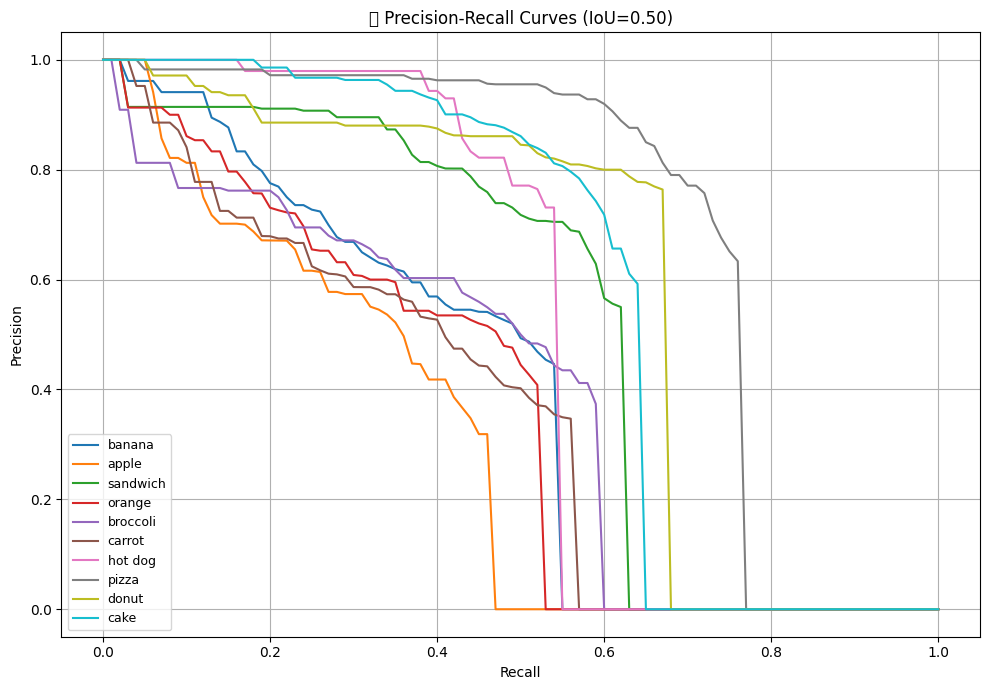

In [ ]:
# قائمة target_category_ids كما في COCO
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]

# نحصل على الفهرس الداخلي لكل فئة داخل COCOeval.params.catIds
cat_id_to_index = {
    cat_id: idx for idx, cat_id in enumerate(evaluator.params.catIds)
}

# أسماء الفئات (يُفضل أن تطابق ما سبق)
category_names = [
    "banana", "apple", "sandwich", "orange", "broccoli",
    "carrot", "hot dog", "pizza", "donut", "cake"
]

import matplotlib.pyplot as plt
import numpy as np

# استخراج مصفوفة precision
precision = evaluator.eval['precision']  # shape = [TxRxKxAxM]

# إعدادات الرسم
iou_threshold_index = 0  # 0 تعني IoU=0.50
area_index = 0           # all area
max_dets_index = 2       # maxDets=100

plt.figure(figsize=(10, 7))

# رسم لكل فئة
for idx, cat_id in enumerate(target_category_ids):
    cat_index = cat_id_to_index[cat_id]
    pr = precision[iou_threshold_index, :, cat_index, area_index, max_dets_index]
    pr = pr[pr > -1]
    recall = np.linspace(0, 1, len(pr))
    plt.plot(recall, pr, label=category_names[idx])

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('📈 Precision-Recall Curves (IoU=0.50)')
plt.grid(True)
plt.legend(loc='lower left', fontsize=9)
plt.tight_layout()
plt.show()


In [ ]:
apple_id = 53  # حسب COCO
apple_img_ids = coco_gt.getImgIds(catIds=[apple_id])
print(f"عدد الصور التي تحتوي على تفاحة: {len(apple_img_ids)}")


عدد الصور التي تحتوي على تفاحة: 76


In [ ]:
img_info = coco_gt.loadImgs(apple_img_ids[0])[0]
image_path = f"val2017/{img_info['file_name']}"


  0%|          | 0/20 [00:00<?, ?it/s]

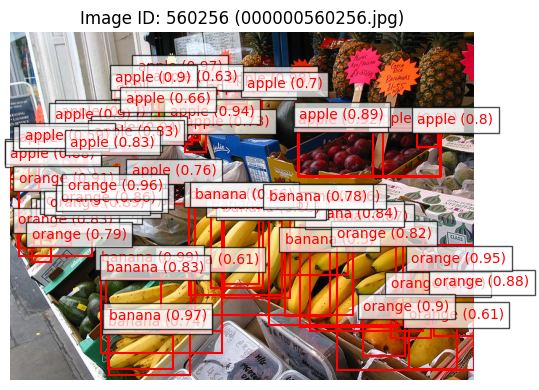

  5%|▌         | 1/20 [00:08<02:43,  8.58s/it]

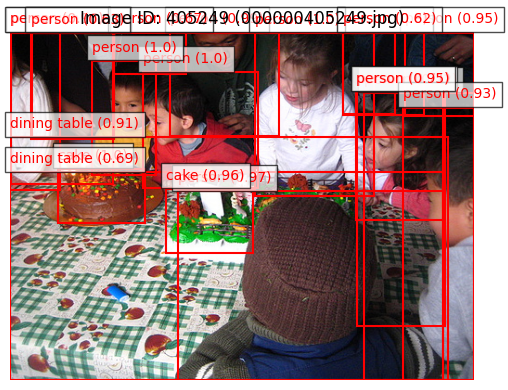

 10%|█         | 2/20 [00:14<02:04,  6.91s/it]

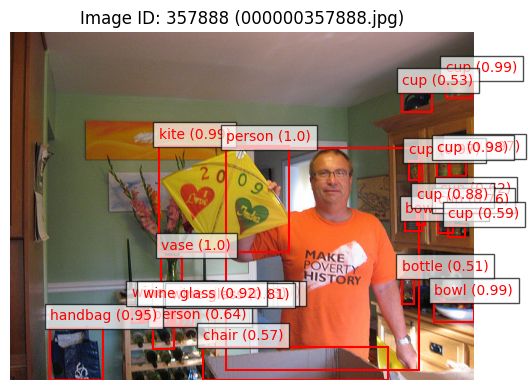

 15%|█▌        | 3/20 [00:20<01:53,  6.68s/it]

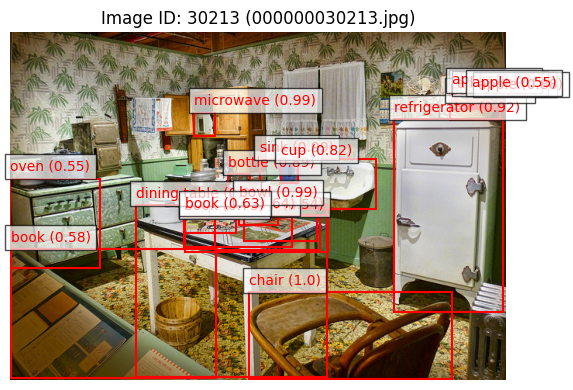

 20%|██        | 4/20 [00:29<01:58,  7.38s/it]

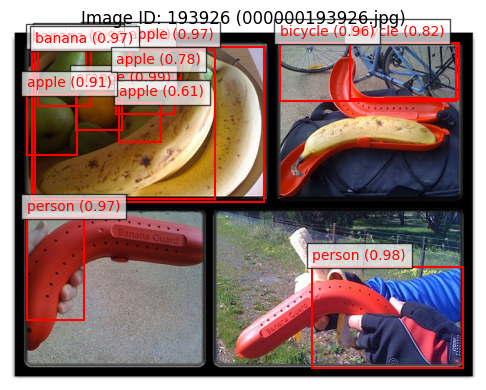

 25%|██▌       | 5/20 [00:34<01:38,  6.56s/it]

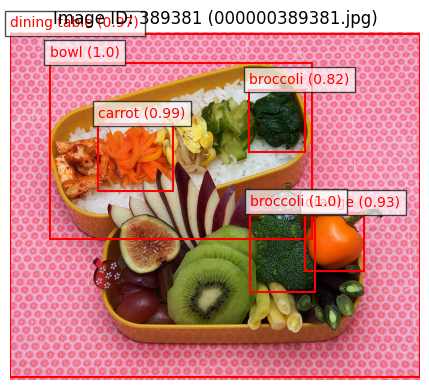

 30%|███       | 6/20 [00:38<01:21,  5.81s/it]

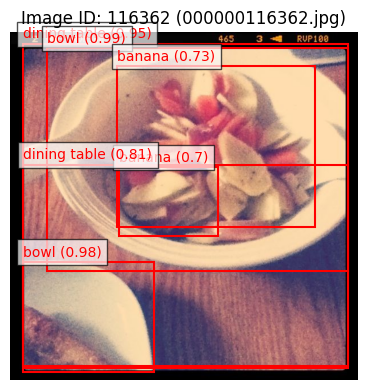

 35%|███▌      | 7/20 [00:43<01:10,  5.46s/it]

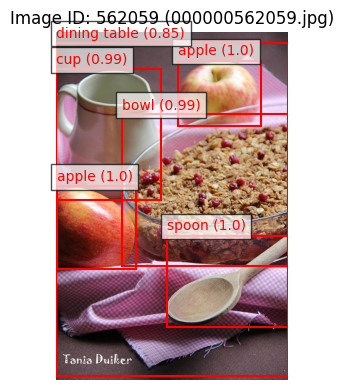

 40%|████      | 8/20 [00:52<01:18,  6.53s/it]

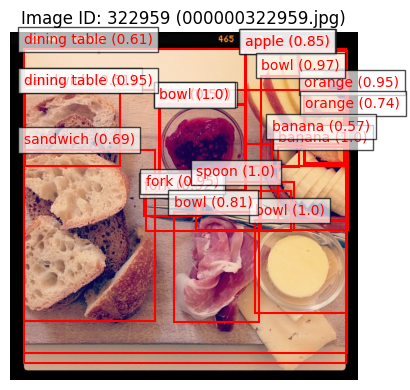

 45%|████▌     | 9/20 [00:58<01:12,  6.58s/it]

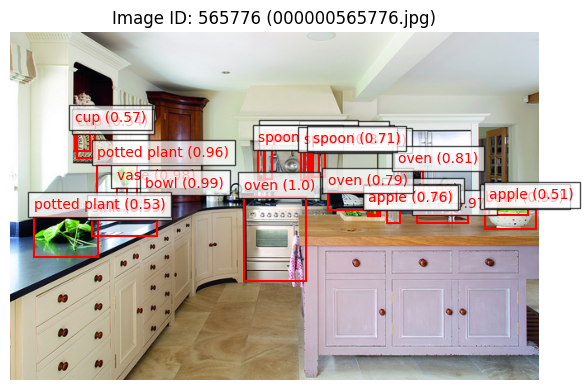

 50%|█████     | 10/20 [01:04<01:03,  6.32s/it]

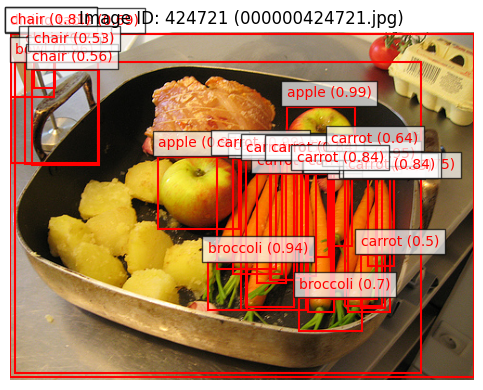

 55%|█████▌    | 11/20 [01:09<00:53,  5.94s/it]

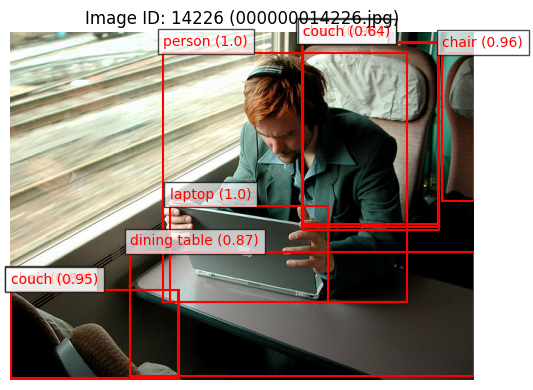

 60%|██████    | 12/20 [01:17<00:53,  6.63s/it]

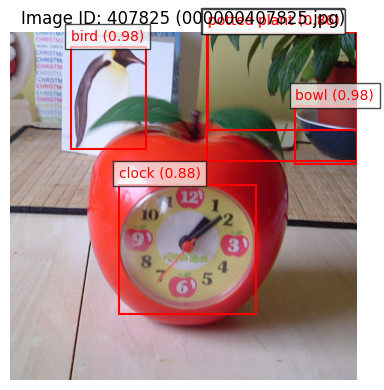

 65%|██████▌   | 13/20 [01:24<00:45,  6.48s/it]

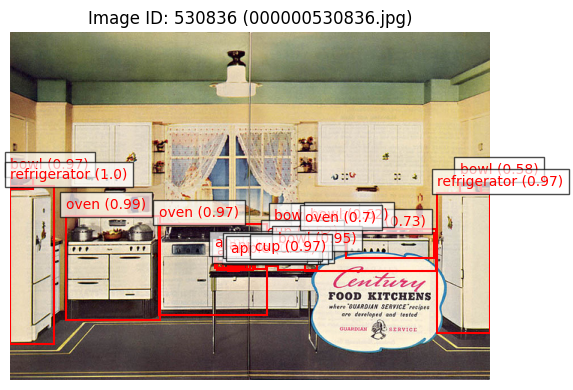

 70%|███████   | 14/20 [01:31<00:41,  6.91s/it]

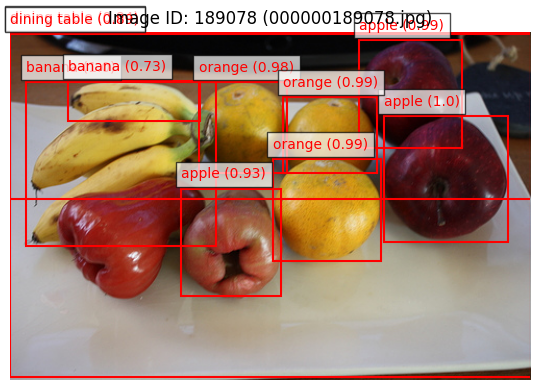

 75%|███████▌  | 15/20 [01:38<00:33,  6.67s/it]

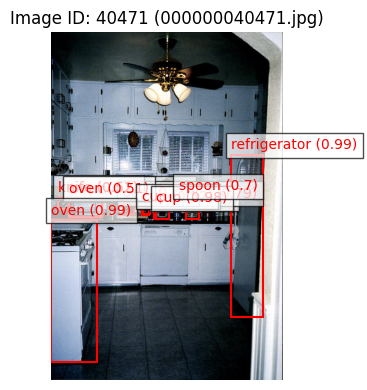

 80%|████████  | 16/20 [01:43<00:25,  6.37s/it]

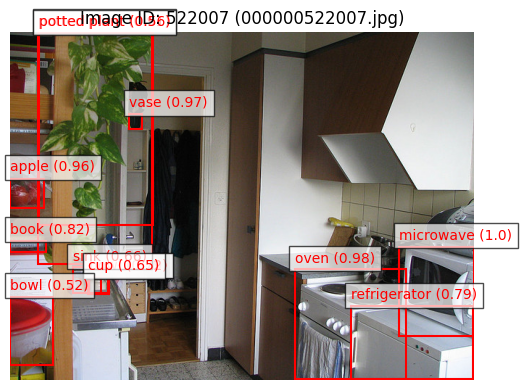

 85%|████████▌ | 17/20 [01:49<00:18,  6.21s/it]

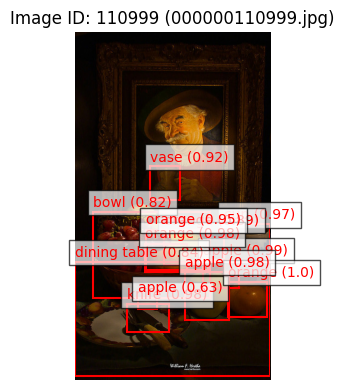

 90%|█████████ | 18/20 [01:58<00:14,  7.10s/it]

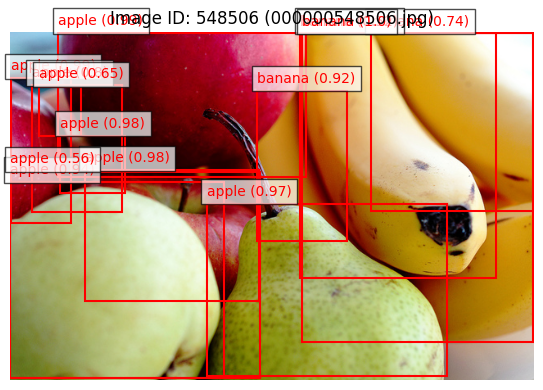

 95%|█████████▌| 19/20 [02:05<00:06,  6.99s/it]

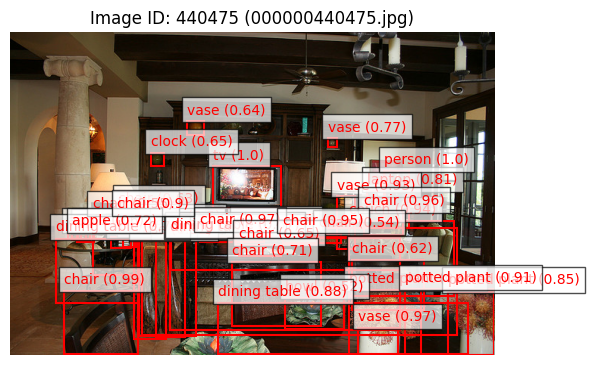

100%|██████████| 20/20 [02:14<00:00,  6.75s/it]


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm import tqdm
import torch

# تعريف المعرف لفئة التفاح
apple_id = 53
apple_img_ids = coco_gt.getImgIds(catIds=[apple_id])

# حصر الصور التي نريد عرضها (كلها أو limit)
selected_ids = apple_img_ids[:20]  # يمكنك تعديل العدد هنا

for img_id in tqdm(selected_ids):
    # تحميل معلومات الصورة
    img_info = coco_gt.loadImgs(img_id)[0]
    image_path = f"val2017/{img_info['file_name']}"
    image = Image.open(image_path).convert("RGB")

    # تمرير الصورة إلى النموذج
    inputs = processor(images=image, return_tensors="pt").to(model.device)
    with torch.no_grad():
        outputs = model(**inputs)
    target_sizes = torch.tensor([image.size[::-1]]).to(model.device)
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.5)[0]

    # عرض الصورة مع الصناديق بشكل مصغّر
    fig, ax = plt.subplots(1, figsize=(6, 4))  # ← صورة صغيرة
    ax.imshow(image)

    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        label_name = model.config.id2label[label.item()]
        box = box.tolist()
        confidence = round(score.item(), 2)

        # رسم البوكس
        rect = patches.Rectangle((box[0], box[1]),
                                 box[2] - box[0], box[3] - box[1],
                                 linewidth=1.5, edgecolor='red', facecolor='none')
        ax.add_patch(rect)

        # كتابة الاسم والدقة
        ax.text(box[0], box[1] - 10, f"{label_name} ({confidence})",
                color='red', fontsize=10, bbox=dict(facecolor='white', alpha=0.7))

    ax.set_title(f"Image ID: {img_id} ({img_info['file_name']})")
    ax.axis('off')
    plt.tight_layout()
    plt.show()


In [ ]:
from pycocotools.cocoeval import COCOeval

# تكرار التقييم مع تغيير عتبة IoU يدويًا
for threshold in [0.4, 0.3]:
    print(f"\n📏 تقييم النموذج عند IoU = {threshold:.2f}")

    evaluator_custom = COCOeval(coco_gt, coco_dt, iouType='bbox')
    evaluator_custom.params.catIds = target_category_ids
    evaluator_custom.params.imgIds = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))

    # تعديل عتبة IoU (عادةً 10 نقاط، الآن نقطة واحدة فقط)
    evaluator_custom.params.iouThrs = [threshold]

    evaluator_custom.evaluate()
    evaluator_custom.accumulate()
    evaluator_custom.summarize()



📏 تقييم النموذج عند IoU = 0.40
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.71s).
Accumulating evaluation results...
DONE (t=0.12s).
 Average Precision  (AP) @[ IoU=0.40:0.40 | area=   all | maxDets=100 ] = 0.504
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = -1.000
 Average Precision  (AP) @[ IoU=0.40:0.40 | area= small | maxDets=100 ] = 0.283
 Average Precision  (AP) @[ IoU=0.40:0.40 | area=medium | maxDets=100 ] = 0.558
 Average Precision  (AP) @[ IoU=0.40:0.40 | area= large | maxDets=100 ] = 0.681
 Average Recall     (AR) @[ IoU=0.40:0.40 | area=   all | maxDets=  1 ] = 0.238
 Average Recall     (AR) @[ IoU=0.40:0.40 | area=   all | maxDets= 10 ] = 0.561
 Average Recall     (AR) @[ IoU=0.40:0.40 | area=   all | maxDets=100 ] = 0.625
 Average Recall     (AR) @[ IoU=0.40:0.40 | area= small | maxDets=100 ] = 0.365
 Average Recall     (AR) @[ IoU=0.4

In [ ]:
from tabulate import tabulate
import numpy as np

category_names = [
    "banana", "apple", "sandwich", "orange", "broccoli",
    "carrot", "hot dog", "pizza", "donut", "cake"
]

# تكرار الحساب عند كل IoU threshold مخصص
for iou_value in [0.4, 0.3]:
    print(f"\n📏 Precision @ IoU={iou_value:.2f} (Recall ≈ 0.5):\n")

    # إعادة تقييم COCOeval عند threshold محدد
    evaluator_custom = COCOeval(coco_gt, coco_dt, iouType='bbox')
    evaluator_custom.params.catIds = target_category_ids
    evaluator_custom.params.imgIds = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))
    evaluator_custom.params.iouThrs = [iou_value]  # فقط عتبة واحدة
    evaluator_custom.evaluate()
    evaluator_custom.accumulate()

    # استخراج الـ precision matrix
    precision = evaluator_custom.eval['precision']  # shape: [TxRxKxAxM]
    iou_threshold_index = 0      # لأنه لدينا IoU واحد فقط
    recall_index = 50            # ≈ 0.5
    area_index = 0
    max_dets_index = 2

    # مطابقة IDs لفهارس داخلية
    cat_id_to_index = {
        cat_id: idx for idx, cat_id in enumerate(evaluator_custom.params.catIds)
    }

    # إنشاء الجدول
    table_data = []
    for idx, cat_id in enumerate(target_category_ids):
        cat_index = cat_id_to_index[cat_id]
        prec_val = precision[iou_threshold_index, recall_index, cat_index, area_index, max_dets_index]
        if prec_val < 0:
            prec_val = 0.0
        table_data.append([category_names[idx], round(prec_val, 3)])

    # عرض الجدول
    print(tabulate(table_data, headers=["Category", f"Precision @ IoU={iou_value}"], tablefmt="grid"))



📏 Precision @ IoU=0.40 (Recall ≈ 0.5):

Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.66s).
Accumulating evaluation results...
DONE (t=0.09s).
+------------+-----------------------+
| Category   |   Precision @ IoU=0.4 |
+============+=======================+
| banana     |                 0.569 |
+------------+-----------------------+
| apple      |                 0     |
+------------+-----------------------+
| sandwich   |                 0.774 |
+------------+-----------------------+
| orange     |                 0.493 |
+------------+-----------------------+
| broccoli   |                 0.582 |
+------------+-----------------------+
| carrot     |                 0.485 |
+------------+-----------------------+
| hot dog    |                 0.774 |
+------------+-----------------------+
| pizza      |                 0.962 |
+------------+-----------------------+
| donut      |                 0.877 |
+------------+-----------------------+
| cake   

Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.51s).
Accumulating evaluation results...
DONE (t=0.08s).


<ipython-input-29-93418799>:46: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


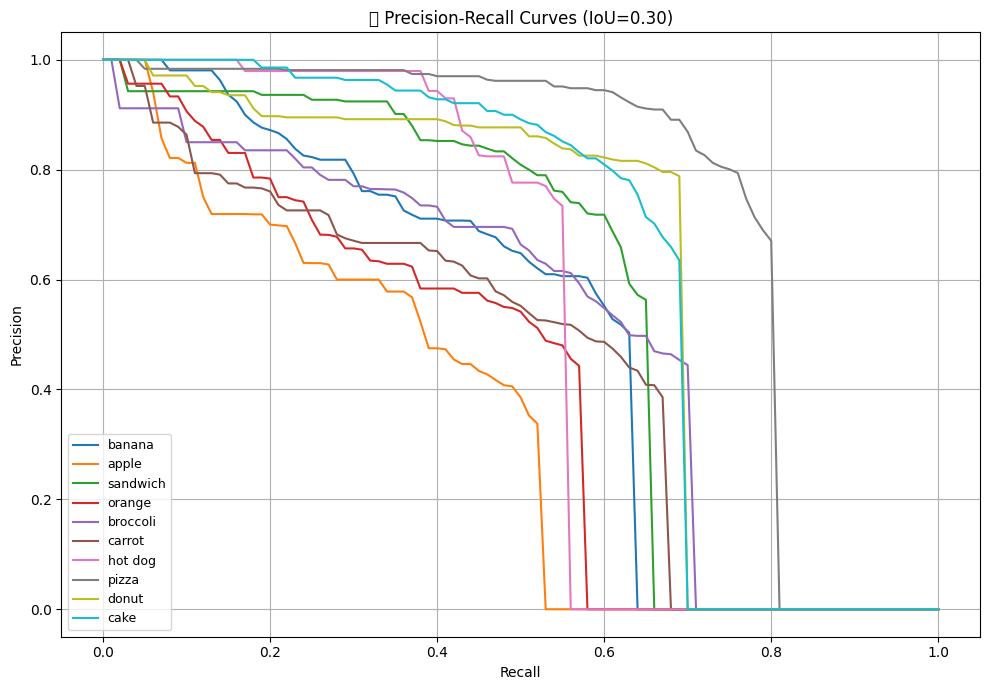

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from pycocotools.cocoeval import COCOeval

# الفئات المستهدفة
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
category_names = [
    "banana", "apple", "sandwich", "orange", "broccoli",
    "carrot", "hot dog", "pizza", "donut", "cake"
]

# تقييم النموذج عند IoU = 0.3
evaluator_03 = COCOeval(coco_gt, coco_dt, iouType='bbox')
evaluator_03.params.catIds = target_category_ids
evaluator_03.params.imgIds = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))
evaluator_03.params.iouThrs = [0.3]  # فقط IoU = 0.3
evaluator_03.evaluate()
evaluator_03.accumulate()

# خريطة الفهرسة
cat_id_to_index = {
    cat_id: idx for idx, cat_id in enumerate(evaluator_03.params.catIds)
}

# استخراج precision
precision = evaluator_03.eval['precision']  # shape: [TxRxKxAxM]
iou_threshold_index = 0    # لأن لدينا فقط IoU=0.3
area_index = 0
max_dets_index = 2

# الرسم
plt.figure(figsize=(10, 7))

for idx, cat_id in enumerate(target_category_ids):
    cat_index = cat_id_to_index[cat_id]
    pr = precision[iou_threshold_index, :, cat_index, area_index, max_dets_index]
    pr = pr[pr > -1]
    recall = np.linspace(0, 1, len(pr))
    plt.plot(recall, pr, label=category_names[idx])

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('📈 Precision-Recall Curves (IoU=0.30)')
plt.grid(True)
plt.legend(loc='lower left', fontsize=9)
plt.tight_layout()
plt.show()


In [ ]:
from pycocotools.cocoeval import COCOeval
from tabulate import tabulate
import numpy as np

# الفئات المطلوبة من COCO
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]

# تقييم COCOeval عند IoU = 0.30 لهذه الفئات فقط
evaluator_03 = COCOeval(coco_gt, coco_dt, iouType='bbox')
evaluator_03.params.catIds = target_category_ids
evaluator_03.params.imgIds = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))
evaluator_03.params.iouThrs = [0.30]
evaluator_03.evaluate()
evaluator_03.accumulate()

# استخراج precision
precision = evaluator_03.eval['precision']  # shape: [TxRxKxAxM]

# إعدادات الفهرسة
iou_index = 0
recall_index = 50
area_index = 0
max_dets_index = 2

# استخراج أسماء الفئات
coco_categories = coco_gt.loadCats(target_category_ids)
cat_id_to_name = {cat["id"]: cat["name"] for cat in coco_categories}
cat_id_to_index = {cat_id: idx for idx, cat_id in enumerate(evaluator_03.params.catIds)}

# بناء الجدول
table_data = []

for cat_id in target_category_ids:
    cat_index = cat_id_to_index[cat_id]
    prec_val = precision[iou_index, recall_index, cat_index, area_index, max_dets_index]
    prec_val = 0.0 if prec_val < 0 else round(float(prec_val), 3)
    table_data.append([cat_id, cat_id_to_name[cat_id], prec_val])

# ترتيب حسب الدقة من الأعلى
table_data = sorted(table_data, key=lambda x: x[2], reverse=True)

# عرض الجدول
print(f"\n📋 Precision لكل فئة طعام عند IoU = 0.30 و Recall ≈ 0.5:\n")
print(tabulate(table_data, headers=["Category ID", "Category Name", "Precision @ IoU=0.30"], tablefmt="grid"))


Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.95s).
Accumulating evaluation results...
DONE (t=0.16s).

📋 Precision لكل فئة طعام عند IoU = 0.30 و Recall ≈ 0.5:

+---------------+-----------------+------------------------+
|   Category ID | Category Name   |   Precision @ IoU=0.30 |
+===============+=================+========================+
|            59 | pizza           |                  0.962 |
+---------------+-----------------+------------------------+
|            61 | cake            |                  0.891 |
+---------------+-----------------+------------------------+
|            60 | donut           |                  0.872 |
+---------------+-----------------+------------------------+
|            54 | sandwich        |                  0.809 |
+---------------+-----------------+------------------------+
|            58 | hot dog         |                  0.776 |
+---------------+-----------------+------------------------+
|            56 | 

In [ ]:
from pycocotools.cocoeval import COCOeval
import pandas as pd

# العتبات المختلفة لتقييم الأداء
iou_thresholds = [0.30]

summary_rows = []

for iou in iou_thresholds:
    evaluator = COCOeval(coco_gt, coco_dt, iouType='bbox')
    evaluator.params.catIds = target_category_ids
    evaluator.params.imgIds = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))
    evaluator.params.iouThrs = [iou]
    evaluator.evaluate()
    evaluator.accumulate()

    stats = evaluator.stats

    summary_rows.append({
        "IoU Threshold": f"{iou:.2f}",
        "AP (All)": round(stats[0], 3),
        "AP (Small)": round(stats[3], 3),
        "AP (Medium)": round(stats[4], 3),
        "AP (Large)": round(stats[5], 3),
    })

# تحويل إلى DataFrame لعرض جميل
df_summary = pd.DataFrame(summary_rows)

# عرض الجدول
print("📋 تحليل الأداء العام للنموذج عند عتبات IoU مختلفة:\n")
display(df_summary)


Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.60s).
Accumulating evaluation results...
DONE (t=0.11s).


IndexError: list index out of range

In [ ]:
from pycocotools.cocoeval import COCOeval
import pandas as pd
from IPython.display import display # Add display for cleaner output in notebook

# العتبات المختلفة لتقييم الأداء
iou_thresholds = [0.30]

summary_rows = []

# Ensure coco_gt and coco_dt are defined and loaded from previous steps
# from pycocotools.coco import COCO
# with open("annotations/instances_val2017.json") as f:
#     coco_val = json.load(f) # assuming coco_val was loaded previously
# coco_gt = COCO("annotations/instances_val2017.json")
# coco_dt = coco_gt.loadRes("detections.json")


for iou in iou_thresholds:
    print(f"--- Evaluating for IoU Threshold: {iou:.2f} ---")
    evaluator = COCOeval(coco_gt, coco_dt, iouType='bbox')

    # Set parameters for evaluation
    evaluator.params.catIds = target_category_ids
    # Use only the relevant image IDs that contain the target categories
    # This list should ideally come from the previous filtering step
    # Check if relevant_image_ids is already defined, otherwise use the image_ids from coco_dt
    if 'relevant_image_ids' in globals():
         evaluator.params.imgIds = list(relevant_image_ids)
    else:
         # Fallback: use image IDs that have detections
         print("Warning: 'relevant_image_ids' not found. Using image IDs from detections.")
         evaluator.params.imgIds = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))


    evaluator.params.iouThrs = [iou]

    # Optional: Print the number of ground truth and detection annotations being used
    print(f"Number of ground truth annotations being considered: {len(coco_gt.getAnnIds(imgIds=evaluator.params.imgIds, catIds=evaluator.params.catIds))}")
    print(f"Number of detection annotations being considered: {len([d for d in coco_dt.dataset['annotations'] if d['image_id'] in evaluator.params.imgIds and d['category_id'] in evaluator.params.catIds])}")


    evaluator.evaluate()
    evaluator.accumulate()

    # Check if stats were generated before trying to access them
    if hasattr(evaluator, 'stats') and len(evaluator.stats) > 0:
        stats = evaluator.stats
        summary_rows.append({
            "IoU Threshold": f"{iou:.2f}",
            "AP (All)": round(stats[0], 3),
            "AP (Small)": round(stats[3], 3),
            "AP (Medium)": round(stats[4], 3),
            "AP (Large)": round(stats[5], 3),
        })
    else:
        print(f"No statistics generated for IoU threshold {iou:.2f}. This may mean no matches were found.")
        # Append a row with placeholder values if no stats were generated
        summary_rows.append({
            "IoU Threshold": f"{iou:.2f}",
            "AP (All)": 0.0,
            "AP (Small)": 0.0,
            "AP (Medium)": 0.0,
            "AP (Large)": 0.0,
        })


# تحويل إلى DataFrame لعرض جميل
df_summary = pd.DataFrame(summary_rows)

# عرض الجدول
print("\n📋 تحليل الأداء العام للنموذج عند عتبات IoU مختلفة:\n")
display(df_summary)

--- Evaluating for IoU Threshold: 0.30 ---
Number of ground truth annotations being considered: 2835
Number of detection annotations being considered: 4289
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.34s).
Accumulating evaluation results...
DONE (t=0.06s).
No statistics generated for IoU threshold 0.30. This may mean no matches were found.

📋 تحليل الأداء العام للنموذج عند عتبات IoU مختلفة:



,IoU Threshold,AP (All),AP (Small),AP (Medium),AP (Large)
0,0.30,0.0,0.0,0.0,0.0


In [ ]:
from pycocotools.cocoeval import COCOeval
import pandas as pd

# فئات الطعام
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
relevant_image_ids = coco_gt.getImgIds(catIds=target_category_ids)

# تقييم عند IoU = 0.30
iou = 0.30
evaluator = COCOeval(coco_gt, coco_dt, iouType='bbox')
evaluator.params.catIds = target_category_ids
evaluator.params.imgIds = relevant_image_ids
evaluator.params.iouThrs = [iou]

print(f"--- Evaluating for IoU Threshold: {iou:.2f} ---")

evaluator.evaluate()
evaluator.accumulate()

# تحقق: هل تم توليد نتائج؟
if evaluator.stats is None or len(evaluator.stats) == 0:
    print("⚠️ لم يتم العثور على إحصائيات. قد لا توجد أي تطابقات بين التنبؤات والـ Ground Truth.")
    df_result = pd.DataFrame([{
        "IoU Threshold": f"{iou:.2f}",
        "AP (All)": 0.0,
        "AP (Small)": 0.0,
        "AP (Medium)": 0.0,
        "AP (Large)": 0.0
    }])
else:
    stats = evaluator.stats
    df_result = pd.DataFrame([{
        "IoU Threshold": f"{iou:.2f}",
        "AP (All)": round(stats[0], 3),
        "AP (Small)": round(stats[3], 3),
        "AP (Medium)": round(stats[4], 3),
        "AP (Large)": round(stats[5], 3)
    }])

# عرض الجدول
print("\n📋 تحليل الأداء العام عند IoU = 0.30:\n")
display(df_result)


--- Evaluating for IoU Threshold: 0.30 ---
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.20s).
Accumulating evaluation results...
Please run evaluate() first
DONE (t=0.00s).
⚠️ لم يتم العثور على إحصائيات. قد لا توجد أي تطابقات بين التنبؤات والـ Ground Truth.

📋 تحليل الأداء العام عند IoU = 0.30:



,IoU Threshold,AP (All),AP (Small),AP (Medium),AP (Large)
0,0.30,0.0,0.0,0.0,0.0


#✅ Commit: 📈 Add PR Curves and Precision Table for Food Categories (IoU=0.30)

Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.33s).
Accumulating evaluation results...
DONE (t=0.06s).


<ipython-input-37-12211747>:52: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128200 (\N{CHART WITH UPWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


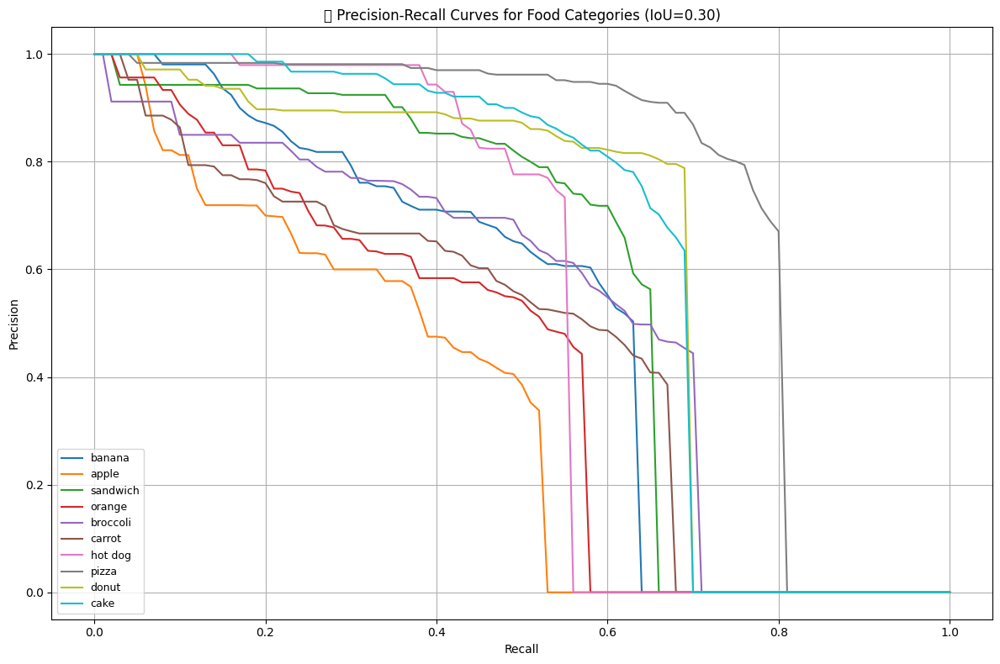


📋 Precision لكل فئة طعام عند IoU = 0.30 و Recall ≈ 0.5:

+------------+----------------------------+
| Category   |   Precision @ Recall ≈ 0.5 |
+============+============================+
| banana     |                      0.648 |
+------------+----------------------------+
| apple      |                      0.386 |
+------------+----------------------------+
| sandwich   |                      0.809 |
+------------+----------------------------+
| orange     |                      0.542 |
+------------+----------------------------+
| broccoli   |                      0.664 |
+------------+----------------------------+
| carrot     |                      0.552 |
+------------+----------------------------+
| hot dog    |                      0.776 |
+------------+----------------------------+
| pizza      |                      0.962 |
+------------+----------------------------+
| donut      |                      0.872 |
+------------+----------------------------+
| cake       |    

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from tabulate import tabulate
from pycocotools.cocoeval import COCOeval

# الفئات المستهدفة
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
category_names = ["banana", "apple", "sandwich", "orange", "broccoli",
                  "carrot", "hot dog", "pizza", "donut", "cake"]

# تقييم عند IoU = 0.3
evaluator_pr = COCOeval(coco_gt, coco_dt, iouType='bbox')
evaluator_pr.params.catIds = target_category_ids
evaluator_pr.params.imgIds = list(set([d["image_id"] for d in coco_dt.dataset["annotations"]]))
evaluator_pr.params.iouThrs = [0.30]
evaluator_pr.evaluate()
evaluator_pr.accumulate()

# استخراج precision
precision = evaluator_pr.eval['precision']

# إعدادات
iou_index = 0
area_index = 0
max_dets_index = 2

# تحضير الجدول
pr_table = []
plt.figure(figsize=(12, 8))

for idx, cat_id in enumerate(target_category_ids):
    cat_index = idx
    pr_values = precision[iou_index, :, cat_index, area_index, max_dets_index]
    pr_values = pr_values[pr_values > -1]
    recall = np.linspace(0, 1, len(pr_values))

    # إضافة للرسم
    plt.plot(recall, pr_values, label=category_names[idx])

    # استخراج Precision عند Recall ≈ 0.5
    if len(pr_values) > 50:
        prec_at_50 = round(float(pr_values[50]), 3)
    else:
        prec_at_50 = 0.0
    pr_table.append([category_names[idx], prec_at_50])

plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('📈 Precision-Recall Curves for Food Categories (IoU=0.30)')
plt.legend(loc='lower left', fontsize=9)
plt.grid(True)
plt.tight_layout()
plt.show()

# عرض الجدول
print("\n📋 Precision لكل فئة طعام عند IoU = 0.30 و Recall ≈ 0.5:\n")
print(tabulate(pr_table, headers=["Category", "Precision @ Recall ≈ 0.5"], tablefmt="grid"))



📋 Confusion Matrix:



,banana,apple,sandwich,orange,broccoli,carrot,hot dog,pizza,donut,cake,No Detection
banana,16,27,6,12,32,51,3,17,2,6,207
apple,10,8,3,8,25,12,2,8,7,6,150
sandwich,6,2,6,5,26,10,0,11,4,3,104
orange,16,7,2,13,20,7,0,10,9,3,200
broccoli,11,12,3,1,15,5,10,16,7,6,230
carrot,34,13,6,6,33,17,12,15,8,7,220
hot dog,5,2,2,2,11,2,3,9,1,3,87
pizza,15,1,2,12,29,15,6,7,2,7,189
donut,9,1,10,7,30,21,11,11,9,16,213
cake,32,13,3,11,25,16,7,9,2,2,196


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


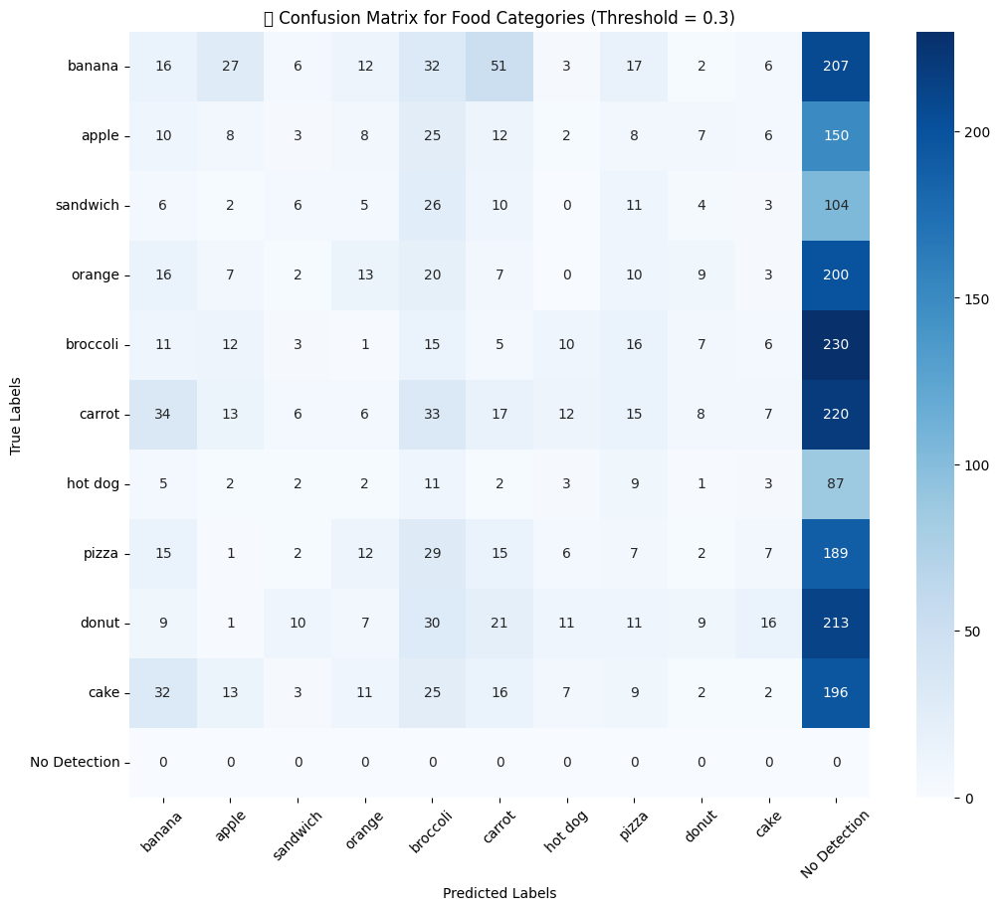

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# استخراج أسماء الفئات
category_names = ["banana", "apple", "sandwich", "orange", "broccoli",
                  "carrot", "hot dog", "pizza", "donut", "cake"]

# تهيئة الحاويات
all_gt_labels = []
all_pred_labels = []

# بناء القيم الحقيقية والتنبؤات
for img_id in evaluator_pr.params.imgIds:
    # تحميل Ground Truth
    ann_ids = coco_gt.getAnnIds(imgIds=[img_id], catIds=target_category_ids)
    anns = coco_gt.loadAnns(ann_ids)
    gt_labels = [ann['category_id'] for ann in anns]

    # تحميل التوقعات
    dt = coco_dt.imgToAnns[img_id] if img_id in coco_dt.imgToAnns else []
    pred_labels = [d['category_id'] for d in dt if d['score'] > 0.3]  # استخدم threshold منطقي

    # إضافة للقوائم
    all_gt_labels.extend(gt_labels)
    all_pred_labels.extend(pred_labels if len(pred_labels) > 0 else [-1])  # -1: no detection

# استبعاد القيم التي ليست ضمن الفئات المطلوبة
valid_gt = []
valid_pred = []

for gt, pred in zip(all_gt_labels, all_pred_labels):
    if gt in target_category_ids:
        valid_gt.append(gt)
        valid_pred.append(pred if pred in target_category_ids else -1)

# بناء المصفوفة
labels = target_category_ids + [-1]  # أضف "no detection" كفئة خاصة
label_names = category_names + ["No Detection"]

cm = confusion_matrix(valid_gt, valid_pred, labels=labels)

# عرض الجدول الرقمي
import pandas as pd
df_cm = pd.DataFrame(cm, index=label_names, columns=label_names)
print("\n📋 Confusion Matrix:\n")
display(df_cm)

# رسم Confusion Matrix
plt.figure(figsize=(12, 10))
sns.heatmap(df_cm, annot=True, fmt='d', cmap='Blues', cbar=True)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('📊 Confusion Matrix for Food Categories (Threshold = 0.3)')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


✅ الدقة الإجمالية (Overall Accuracy) عند Threshold = 0.5: 0.034 (3.39%)


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


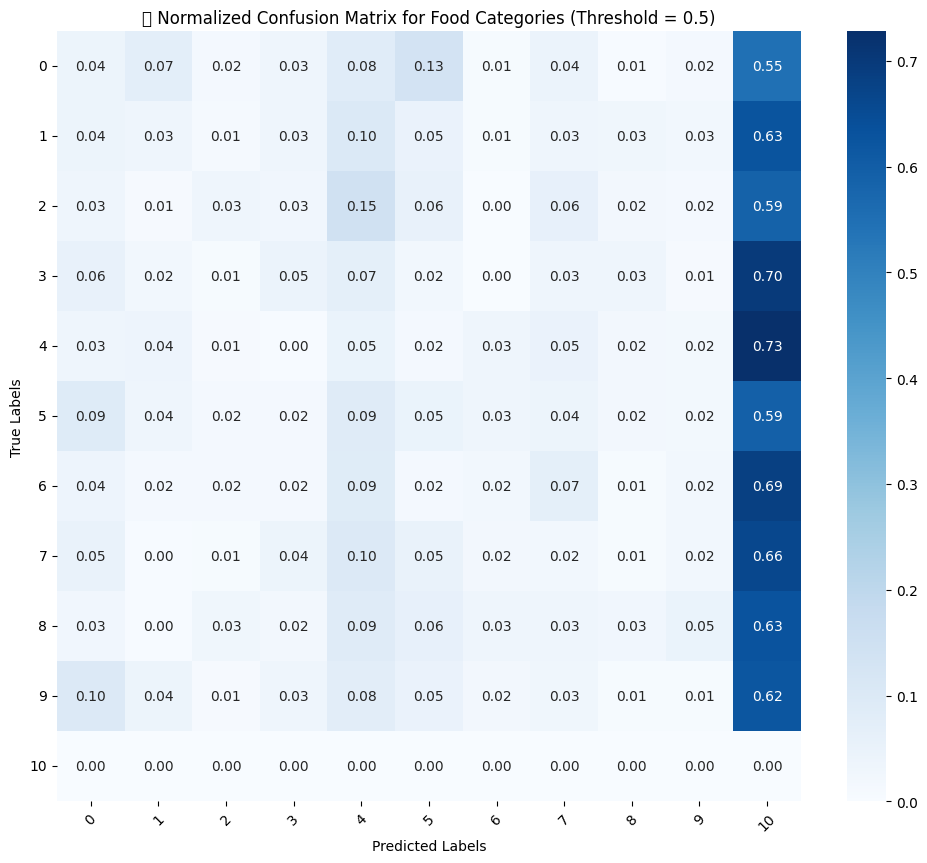

In [45]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# الفئات المستهدفة
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
category_names = ["banana", "apple", "sandwich", "orange", "broccoli",
                  "carrot", "hot dog", "pizza", "donut", "cake"]

# تهيئة الحاويات
all_gt_labels = []
all_pred_labels = []

# بناء القيم الحقيقية والتنبؤات
for img_id in evaluator_pr.params.imgIds:
    # تحميل Ground Truth
    ann_ids = coco_gt.getAnnIds(imgIds=[img_id], catIds=target_category_ids)
    anns = coco_gt.loadAnns(ann_ids)
    gt_labels = [ann['category_id'] for ann in anns]

    # تحميل التوقعات
    dt = coco_dt.imgToAnns[img_id] if img_id in coco_dt.imgToAnns else []
    pred_labels = [d['category_id'] for d in dt if d['score'] > 0.5]  # رفع Threshold إلى 0.5

    # إضافة للقوائم
    all_gt_labels.extend(gt_labels)
    all_pred_labels.extend(pred_labels if len(pred_labels) > 0 else [-1])  # -1: no detection

# استبعاد القيم التي ليست ضمن الفئات المطلوبة
valid_gt = []
valid_pred = []

for gt, pred in zip(all_gt_labels, all_pred_labels):
    if gt in target_category_ids:
        valid_gt.append(gt)
        valid_pred.append(pred if pred in target_category_ids else -1)

# بناء المصفوفة
labels = target_category_ids + [-1]  # أضف "no detection" كفئة خاصة
label_names = category_names + ["No Detection"]

cm = confusion_matrix(valid_gt, valid_pred, labels=labels)

# حساب الدقة الإجمالية
correct_predictions = np.trace(cm)
total_predictions = np.sum(cm)
accuracy = correct_predictions / total_predictions

print(f"✅ الدقة الإجمالية (Overall Accuracy) عند Threshold = 0.5: {accuracy:.3f} ({accuracy*100:.2f}%)")

# رسم Normalized Confusion Matrix مع حماية ضد القسمة على صفر
row_sums = cm.sum(axis=1)[:, np.newaxis]
row_sums[row_sums == 0] = 1  # لتفادي القسمة على صفر
cm_normalized = cm.astype('float') / row_sums

plt.figure(figsize=(12, 10))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', cbar=True)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('📊 Normalized Confusion Matrix for Food Categories (Threshold = 0.5)')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()


In [48]:
# إجمالي عدد الصور في التقييم
total_images = len(evaluator_pr.params.imgIds)
print(f"📸 عدد الصور التي تم التقييم عليها: {total_images}")

# استخراج عدد الصور التي تحتوي على كل فئة
category_names = ["banana", "apple", "sandwich", "orange", "broccoli",
                  "carrot", "hot dog", "pizza", "donut", "cake"]

from tabulate import tabulate
image_counts = []

for cat_id, cat_name in zip(target_category_ids, category_names):
    img_ids = coco_gt.getImgIds(catIds=[cat_id])
    image_counts.append([cat_id, cat_name, len(img_ids)])

print("\n📋 عدد الصور التي تحتوي على كل فئة:\n")
print(tabulate(image_counts, headers=["Category ID", "Category Name", "Image Count"], tablefmt="grid"))

# عدد الصور التي لا تحتوي على أي فئة من target_category_ids
all_images = set(coco_gt.getImgIds())
target_images = set()
for cat_id in target_category_ids:
    target_images.update(coco_gt.getImgIds(catIds=[cat_id]))

non_target_images = all_images - target_images
print(f"\n📸 عدد الصور التي لا تحتوي على أي فئة من الفئات المستهدفة: {len(non_target_images)}")


📸 عدد الصور التي تم التقييم عليها: 708

📋 عدد الصور التي تحتوي على كل فئة:

+---------------+-----------------+---------------+
|   Category ID | Category Name   |   Image Count |
+===============+=================+===============+
|            52 | banana          |           103 |
+---------------+-----------------+---------------+
|            53 | apple           |            76 |
+---------------+-----------------+---------------+
|            54 | sandwich        |            98 |
+---------------+-----------------+---------------+
|            55 | orange          |            85 |
+---------------+-----------------+---------------+
|            56 | broccoli        |            71 |
+---------------+-----------------+---------------+
|            57 | carrot          |            81 |
+---------------+-----------------+---------------+
|            58 | hot dog         |            51 |
+---------------+-----------------+---------------+
|            59 | pizza           |     

In [49]:
relevant_image_ids = coco_gt.getImgIds(catIds=target_category_ids)


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


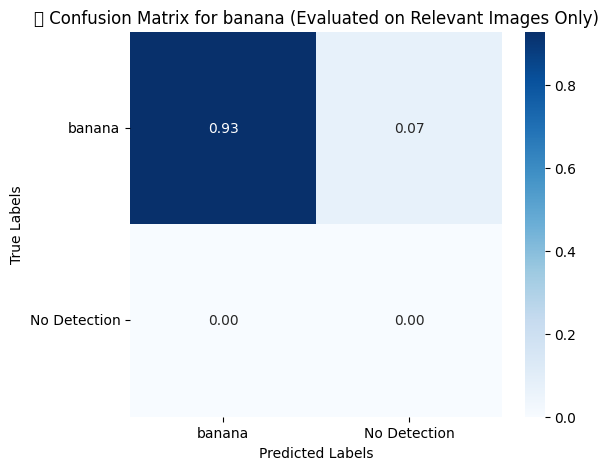

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


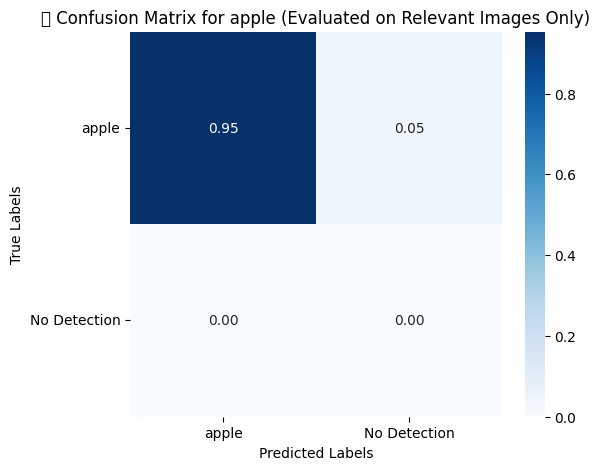

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


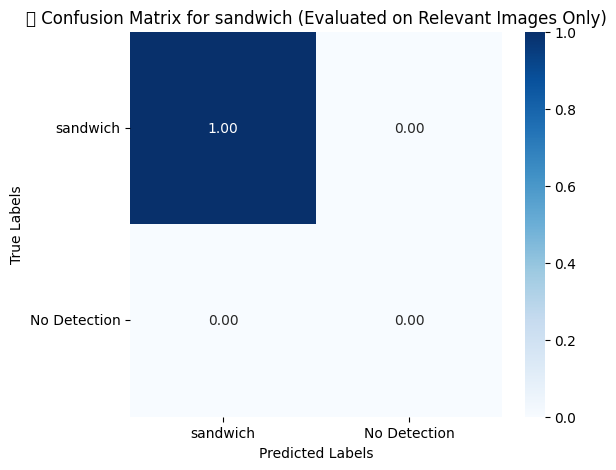

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


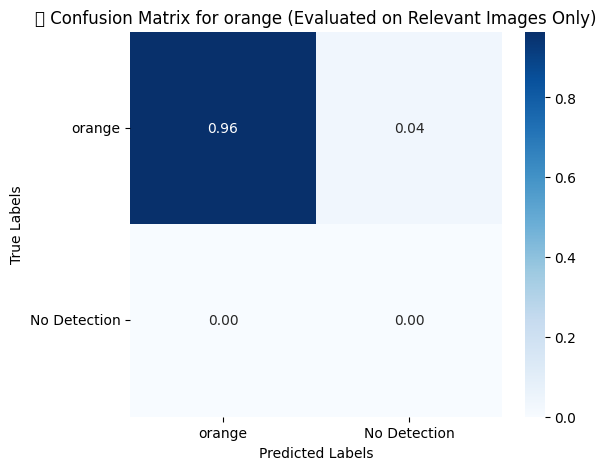

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


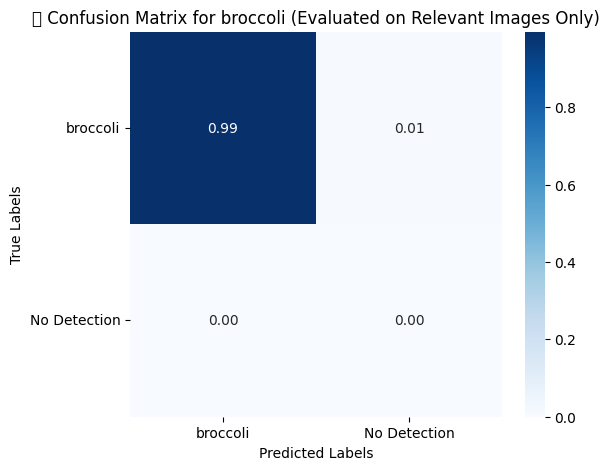

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


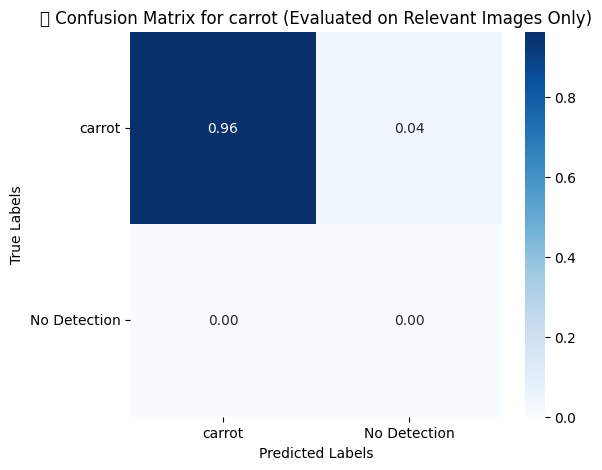

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


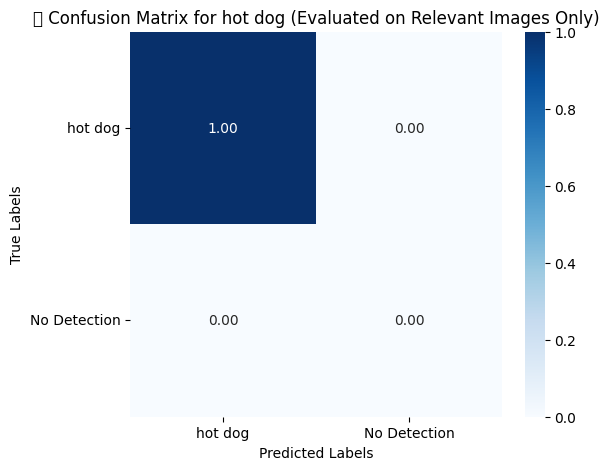

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


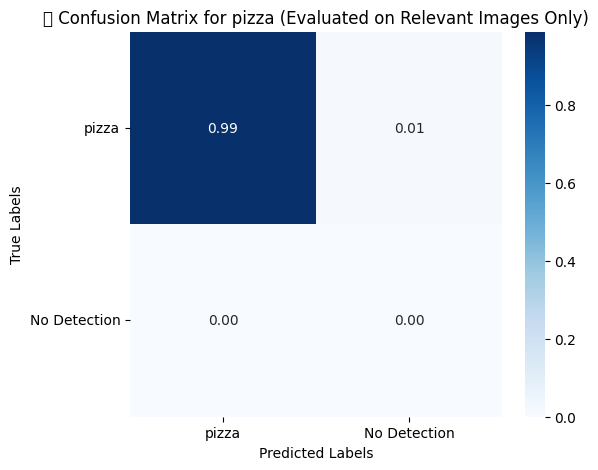

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


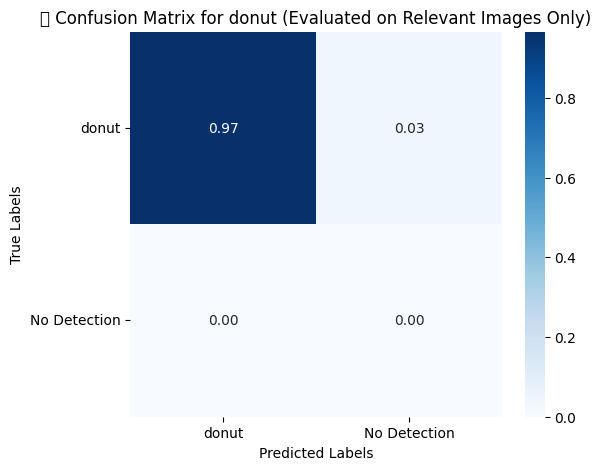

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


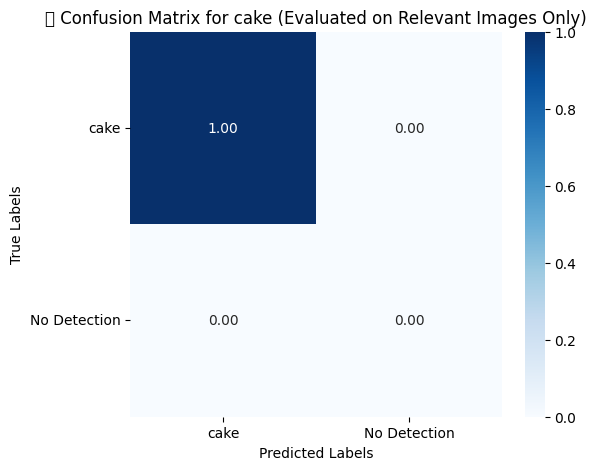


📋 الدقة لكل فئة (تم التقييم على الصور التي تحتوي على نفس الفئة فقط):

+------------+------------+--------------+
| Category   |   Accuracy | Accuracy %   |
+============+============+==============+
| banana     |      0.927 | 92.74%       |
+------------+------------+--------------+
| apple      |      0.953 | 95.29%       |
+------------+------------+--------------+
| sandwich   |      1     | 100.00%      |
+------------+------------+--------------+
| orange     |      0.965 | 96.46%       |
+------------+------------+--------------+
| broccoli   |      0.995 | 99.49%       |
+------------+------------+--------------+
| carrot     |      0.964 | 96.36%       |
+------------+------------+--------------+
| hot dog    |      1     | 100.00%      |
+------------+------------+--------------+
| pizza      |      0.987 | 98.73%       |
+------------+------------+--------------+
| donut      |      0.966 | 96.57%       |
+------------+------------+--------------+
| cake       |      1     

In [53]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd

# الفئات المستهدفة
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
category_names = ["banana", "apple", "sandwich", "orange", "broccoli",
                  "carrot", "hot dog", "pizza", "donut", "cake"]

# إعداد نتائج لجميع الفئات
all_cm = {}
accuracies = []

for cat_id, cat_name in zip(target_category_ids, category_names):
    # استخراج الصور التي تحتوي على هذه الفئة فقط
    cat_img_ids = coco_gt.getImgIds(catIds=[cat_id])

    all_gt_labels = []
    all_pred_labels = []

    for img_id in cat_img_ids:
        # تحميل Ground Truth
        ann_ids = coco_gt.getAnnIds(imgIds=[img_id], catIds=[cat_id])
        anns = coco_gt.loadAnns(ann_ids)
        gt_labels = [ann['category_id'] for ann in anns]

        # تحميل التوقعات
        dt = coco_dt.imgToAnns[img_id] if img_id in coco_dt.imgToAnns else []
        pred_labels = [d['category_id'] for d in dt if d['score'] > 0.3]  # Threshold 0.5

        # إذا لم يتم اكتشاف شيء → No Detection (-1)
        if len(pred_labels) == 0:
            pred_labels = [-1] * len(gt_labels)
        else:
            if len(pred_labels) < len(gt_labels):
                pred_labels.extend([-1] * (len(gt_labels) - len(pred_labels)))

        all_gt_labels.extend(gt_labels)
        all_pred_labels.extend(pred_labels[:len(gt_labels)])

    # بناء المصفوفة
    labels = [cat_id, -1]  # فئة + No Detection
    label_names = [cat_name, "No Detection"]

    cm = confusion_matrix(all_gt_labels, all_pred_labels, labels=labels)
    all_cm[cat_name] = cm

    # حساب الدقة لهذه الفئة
    correct_predictions = np.trace(cm)
    total_predictions = np.sum(cm)
    accuracy = correct_predictions / total_predictions if total_predictions != 0 else 0.0
    accuracies.append([cat_name, round(accuracy, 3), f"{accuracy*100:.2f}%"])

    # رسم المصفوفة لهذه الفئة
    row_sums = cm.sum(axis=1)[:, np.newaxis]
    row_sums[row_sums == 0] = 1
    cm_normalized = cm.astype('float') / row_sums

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', cbar=True)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(f'📊 Confusion Matrix for {cat_name} (Evaluated on Relevant Images Only)')
    plt.xticks(ticks=[0.5, 1.5], labels=[cat_name, "No Detection"], rotation=0)
    plt.yticks(ticks=[0.5, 1.5], labels=[cat_name, "No Detection"], rotation=0)
    plt.show()

# عرض جدول الدقة لكل فئة
print("\n📋 الدقة لكل فئة (تم التقييم على الصور التي تحتوي على نفس الفئة فقط):\n")
from tabulate import tabulate
print(tabulate(accuracies, headers=["Category", "Accuracy", "Accuracy %"], tablefmt="grid"))


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


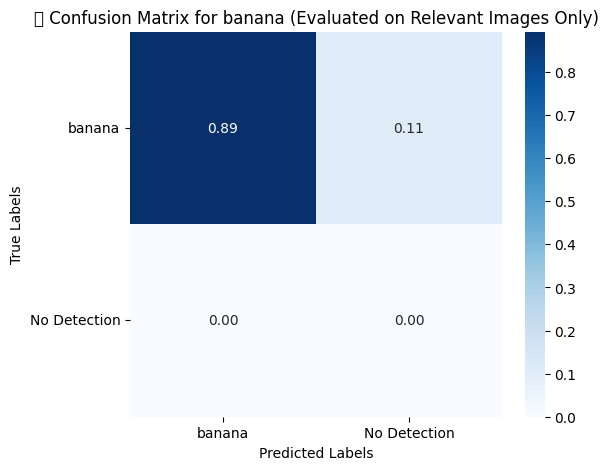

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


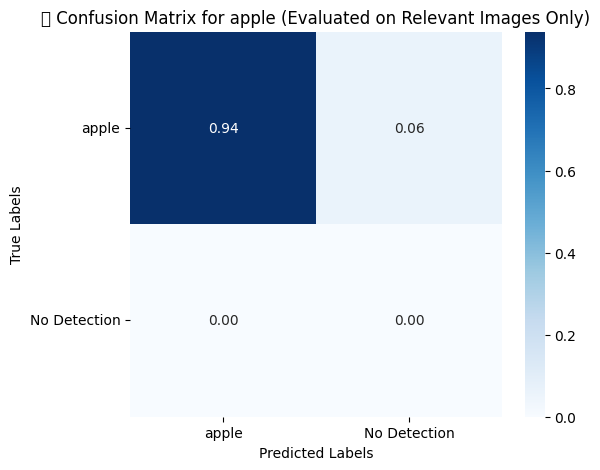

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


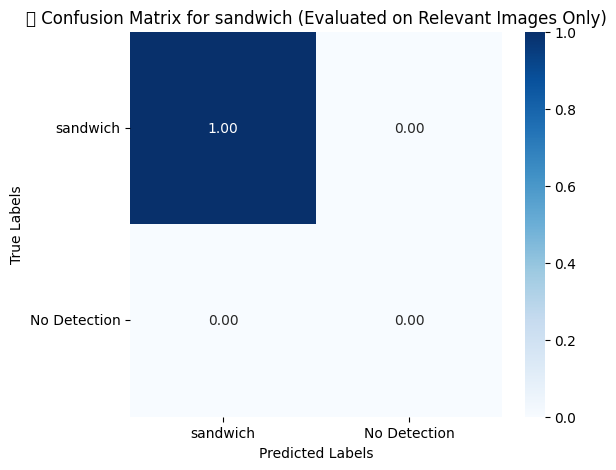

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


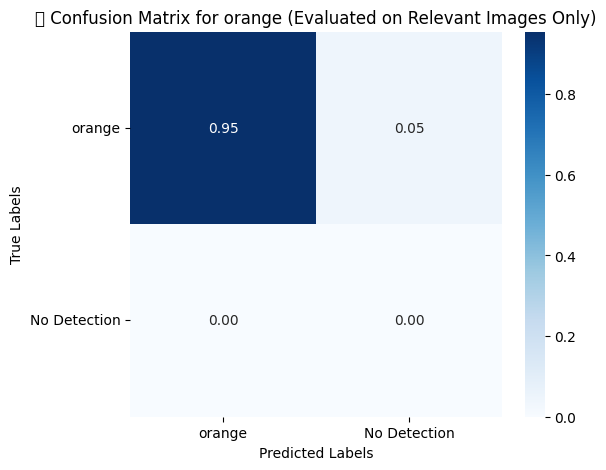

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


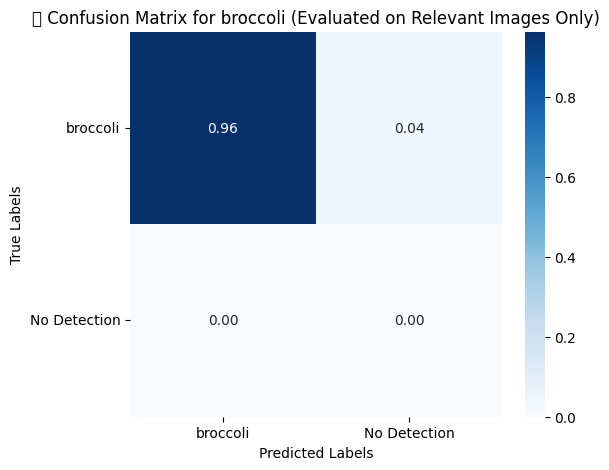

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


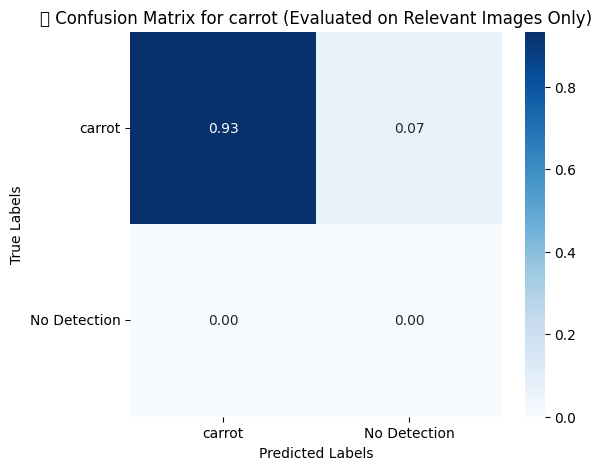

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


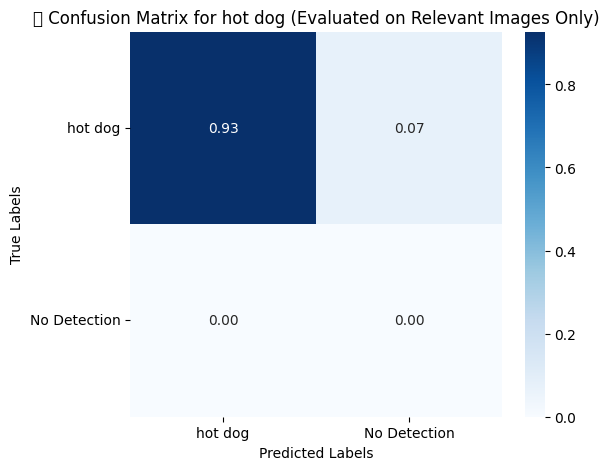

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


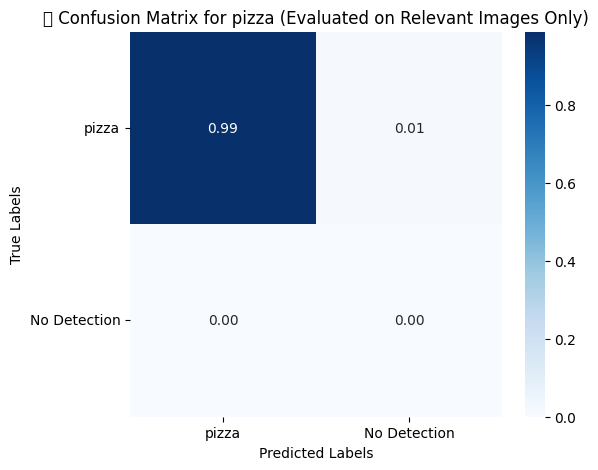

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


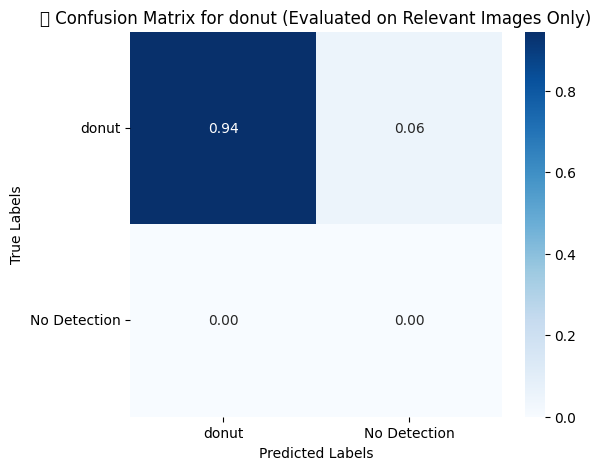

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


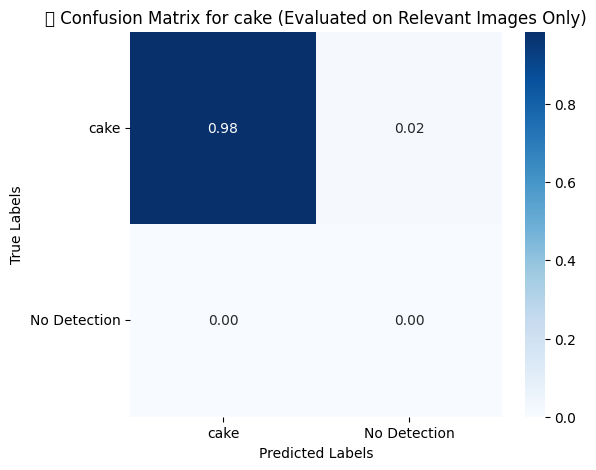


📋 الدقة لكل فئة (تم التقييم على الصور التي تحتوي على نفس الفئة فقط):

+------------+------------+--------------+
| Category   |   Accuracy | Accuracy %   |
+============+============+==============+
| banana     |      0.893 | 89.32%       |
+------------+------------+--------------+
| apple      |      0.938 | 93.83%       |
+------------+------------+--------------+
| sandwich   |      1     | 100.00%      |
+------------+------------+--------------+
| orange     |      0.955 | 95.50%       |
+------------+------------+--------------+
| broccoli   |      0.964 | 96.45%       |
+------------+------------+--------------+
| carrot     |      0.934 | 93.40%       |
+------------+------------+--------------+
| hot dog    |      0.927 | 92.68%       |
+------------+------------+--------------+
| pizza      |      0.988 | 98.80%       |
+------------+------------+--------------+
| donut      |      0.945 | 94.47%       |
+------------+------------+--------------+
| cake       |      0.985 

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score
import pandas as pd

# الفئات المستهدفة
target_category_ids = [52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
category_names = ["banana", "apple", "sandwich", "orange", "broccoli",
                  "carrot", "hot dog", "pizza", "donut", "cake"]

# إعداد نتائج لجميع الفئات
all_cm = {}
accuracies = []

for cat_id, cat_name in zip(target_category_ids, category_names):
    # استخراج الصور التي تحتوي على هذه الفئة فقط
    cat_img_ids = coco_gt.getImgIds(catIds=[cat_id])

    all_gt_labels = []
    all_pred_labels = []

    for img_id in cat_img_ids:
        # تحميل Ground Truth
        ann_ids = coco_gt.getAnnIds(imgIds=[img_id], catIds=[cat_id])
        anns = coco_gt.loadAnns(ann_ids)
        gt_labels = [ann['category_id'] for ann in anns]

        # تحميل التوقعات
        dt = coco_dt.imgToAnns[img_id] if img_id in coco_dt.imgToAnns else []
        pred_labels = [d['category_id'] for d in dt if d['score'] > 0.7]  # Threshold 0.5

        # إذا لم يتم اكتشاف شيء → No Detection (-1)
        if len(pred_labels) == 0:
            pred_labels = [-1] * len(gt_labels)
        else:
            if len(pred_labels) < len(gt_labels):
                pred_labels.extend([-1] * (len(gt_labels) - len(pred_labels)))

        all_gt_labels.extend(gt_labels)
        all_pred_labels.extend(pred_labels[:len(gt_labels)])

    # بناء المصفوفة
    labels = [cat_id, -1]  # فئة + No Detection
    label_names = [cat_name, "No Detection"]

    cm = confusion_matrix(all_gt_labels, all_pred_labels, labels=labels)
    all_cm[cat_name] = cm

    # حساب الدقة لهذه الفئة
    correct_predictions = np.trace(cm)
    total_predictions = np.sum(cm)
    accuracy = correct_predictions / total_predictions if total_predictions != 0 else 0.0
    accuracies.append([cat_name, round(accuracy, 3), f"{accuracy*100:.2f}%"])

    # رسم المصفوفة لهذه الفئة
    row_sums = cm.sum(axis=1)[:, np.newaxis]
    row_sums[row_sums == 0] = 1
    cm_normalized = cm.astype('float') / row_sums

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', cbar=True)
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(f'📊 Confusion Matrix for {cat_name} (Evaluated on Relevant Images Only)')
    plt.xticks(ticks=[0.5, 1.5], labels=[cat_name, "No Detection"], rotation=0)
    plt.yticks(ticks=[0.5, 1.5], labels=[cat_name, "No Detection"], rotation=0)
    plt.show()

# عرض جدول الدقة لكل فئة
print("\n📋 الدقة لكل فئة (تم التقييم على الصور التي تحتوي على نفس الفئة فقط):\n")
from tabulate import tabulate
print(tabulate(accuracies, headers=["Category", "Accuracy", "Accuracy %"], tablefmt="grid"))


#✅ كود رسم Detection Confidence Histogram




/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


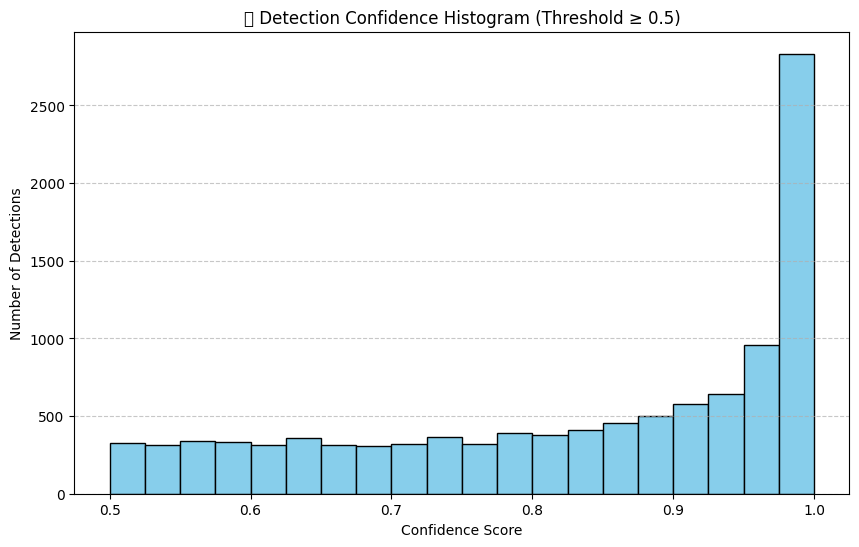

📊 عدد التنبؤات المقبولة (Confidence ≥ 0.5): 10753


In [59]:
import matplotlib.pyplot as plt

# إعدادات Threshold
confidence_threshold = 0.5

# استخراج جميع درجات الثقة التي تم قبولها
all_confidences = []

for img_id in evaluator_pr.params.imgIds:
    # تحميل التوقعات
    dt = coco_dt.imgToAnns[img_id] if img_id in coco_dt.imgToAnns else []
    for d in dt:
        if d['score'] >= confidence_threshold:
            all_confidences.append(d['score'])

# رسم Histogram
plt.figure(figsize=(10, 6))
plt.hist(all_confidences, bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Confidence Score')
plt.ylabel('Number of Detections')
plt.title(f'📉 Detection Confidence Histogram (Threshold ≥ {confidence_threshold})')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# طباعة عدد التنبؤات
print(f"📊 عدد التنبؤات المقبولة (Confidence ≥ {confidence_threshold}): {len(all_confidences)}")
